## Group9_ProjectA

In [1]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import numpy as np
import pandas as pd
import scipy.stats as scs
import statsmodels.api as sm
from statsmodels.regression.rolling import RollingOLS
from itertools import product

In [2]:
aspect_ratio=(16, 9)
pct_format_4d = '{:.4%}'
pct_format_2d = '{:.2%}'
annualization_factor=260

# 1

#### Dataset of all securities

In [3]:
def read_data_frame(filename, index_col=0, parse_dates=True):
    dF = pd.read_csv(filename, index_col=index_col, parse_dates=parse_dates)
    print('\n1)','INFO')
    dF.info() # print info
    print('\n2)', 'ANY NULL VALUES?')
    print(dF.isnull().sum()) # check if any null values
    print('\n3)', 'SUMMARY STATISTICS')
    display(dF.describe()) # print summary statistics
    display(dF) # eyeball the full dF and then return it
    return dF

In [4]:
dfPrices = read_data_frame('Prices.csv')


1) INFO
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4745 entries, 1999-12-31 to 2018-12-31
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    4745 non-null   float64
 1   AMZN    4745 non-null   float64
 2   ATT     4745 non-null   float64
 3   AUD     4745 non-null   float64
 4   BOND    4745 non-null   float64
 5   EUR     4745 non-null   float64
 6   GE      4745 non-null   float64
 7   GOLD    4745 non-null   float64
 8   INTC    4745 non-null   float64
 9   SILVER  4745 non-null   float64
 10  SPY     4745 non-null   float64
dtypes: float64(11)
memory usage: 444.8 KB

2) ANY NULL VALUES?
AAPL      0
AMZN      0
ATT       0
AUD       0
BOND      0
EUR       0
GE        0
GOLD      0
INTC      0
SILVER    0
SPY       0
dtype: int64

3) SUMMARY STATISTICS


,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
count,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000
mean,12.906481,14.276243,24.837516,0.784642,1002.848125,1.214517,217.450605,910.952462,28.220152,14.879354,150.594514
std,13.980654,20.515985,5.171241,0.151062,76.259687,0.169549,78.177993,463.432487,10.666220,8.763344,50.893894
min,0.234286,0.298500,14.607251,0.479000,790.241628,0.827200,51.230770,255.550000,12.080000,4.060000,68.110001
25%,1.089286,1.973500,20.037764,0.707200,957.942747,1.112800,155.384613,418.350000,21.080000,6.805000,114.570000
50%,6.513214,4.441000,25.188822,0.766700,1003.602410,1.235500,215.692307,954.950000,25.230000,14.666000,133.779999
75%,22.629999,16.110001,28.429003,0.903000,1065.474821,1.336800,264.461548,1277.980000,32.799999,18.310500,186.309998
max,58.017502,101.975502,44.184292,1.102000,1128.970002,1.599100,461.538452,1897.460000,74.875000,48.443800,293.579987


,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
1999-12-31,0.917969,3.806250,36.820244,0.6567,798.154631,1.0062,396.794861,288.00,41.156250,5.3800,146.875000
2000-01-03,0.999442,4.468750,35.498489,0.6585,793.868670,1.0243,384.615387,289.00,43.500000,5.4050,145.437500
2000-01-04,0.915179,4.096875,33.421452,0.6550,796.761677,1.0296,369.230774,282.25,41.468750,5.3250,139.750000
2000-01-05,0.928571,3.487500,33.940708,0.6579,793.118215,1.0321,368.589752,280.00,41.812500,5.1450,140.000000
2000-01-06,0.848214,3.278125,33.043808,0.6533,795.091984,1.0328,373.517639,281.10,39.375000,5.1200,137.750000
...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,36.707500,67.197998,20.664654,0.7049,998.805410,1.1406,53.230770,1269.22,43.590000,14.7750,234.339996
2018-12-26,39.292500,73.544998,21.208460,0.7066,996.301026,1.1353,56.846153,1267.14,46.189999,15.0355,246.179993
2018-12-27,39.037498,73.082001,21.261330,0.7033,998.396182,1.1430,55.923077,1275.71,46.360001,15.2275,248.070007
2018-12-28,39.057499,73.901001,21.495468,0.7047,998.680796,1.1444,57.769230,1280.71,46.750000,15.3839,247.750000


There are no NULL values in the data. Furthermore, we can see some descriptive statistics of the columns.

#### Moving Average Crossover Strategy (Go Short)

Let us run moving average crossover strategy for all the securities.

In [5]:
def movingAverageCrossover(dataFrame, fastWindow, slowWindow, flatOrShort):
    dataFrame = dataFrame.copy()   # We don't want to affect the original data frame
    dataFrame.loc[:,'FastSMA'] = dataFrame.iloc[:,0].rolling(fastWindow).mean()
    dataFrame.loc[:,'SlowSMA'] = dataFrame.iloc[:,0].rolling(slowWindow).mean()
    dataFrame.dropna(inplace=True)
    dataFrame.loc[:,'Position'] = np.where(dataFrame['FastSMA'] > dataFrame['SlowSMA'], 1, flatOrShort)
    dataFrame.loc[:,'OriginalReturns'] = np.log(dataFrame.iloc[:,0] / dataFrame.iloc[:,0].shift(1))
    dataFrame.loc[:,'SMAReturns'] = dataFrame['Position'].shift(1) * dataFrame['OriginalReturns']
    dataFrame.dropna(inplace=True)
    return dataFrame[['OriginalReturns', 'SMAReturns']]

For convenience, we'll implement a function that accepts a data frame of log returns and calculates the Sharpe ratio.

In [6]:
def calculateSharpe(dataFrame, af = annualization_factor):
    return (np.sqrt(af) * dataFrame.mean() / dataFrame.std())[0]

We'll store the possible values of fast window and slow window in `fastWindows` and `slowWindows` respectively.

In [7]:
fastWindows = np.array(range(5, 110))
slowWindows = np.array(range(50,500,5))

Next, we'll take the cartesian product of `fastWindows` and `slowWindows` and store it in `comb`.

In [8]:
comb = np.array(list(product(fastWindows, slowWindows)))

We need to exclude the cases when fast window ≥ slow window.

In [9]:
comb = comb[comb[:,0] < comb[:,1]]   # comb[:,0] has fast window values and comb[:,1] has slow window values

Now, we'll run `movingAverageCrossover()` for each combination of fast window and slow window and store the Sharpe ratio of each combo to `sharpe`.<br>
We'll repeat this for all securities.

In [10]:
sharpe_arr_list = []

In [11]:
for j in range(len(dfPrices.columns)): # Iterate through securities
    sharpe = []
    for i in range(len(comb)): # Iterate through window sizes
        temp_df = movingAverageCrossover(dfPrices.iloc[:,j].to_frame(), fastWindow = comb[i, 0], slowWindow = comb[i, 1], flatOrShort = -1)[['SMAReturns']]
        sharpe.append(calculateSharpe(temp_df))
    sharpe_arr_list.append(np.array(sharpe.copy()))

`avg_sharpe_arr` is an array that contains the average Sharpe of all securities for each combination of slow window and fast window.

In [12]:
avg_sharpe_arr = sum(sharpe_arr_list)/len(sharpe_arr_list)

Let us examine the plot of the average Sharpes for each combination of slow window and fast window.

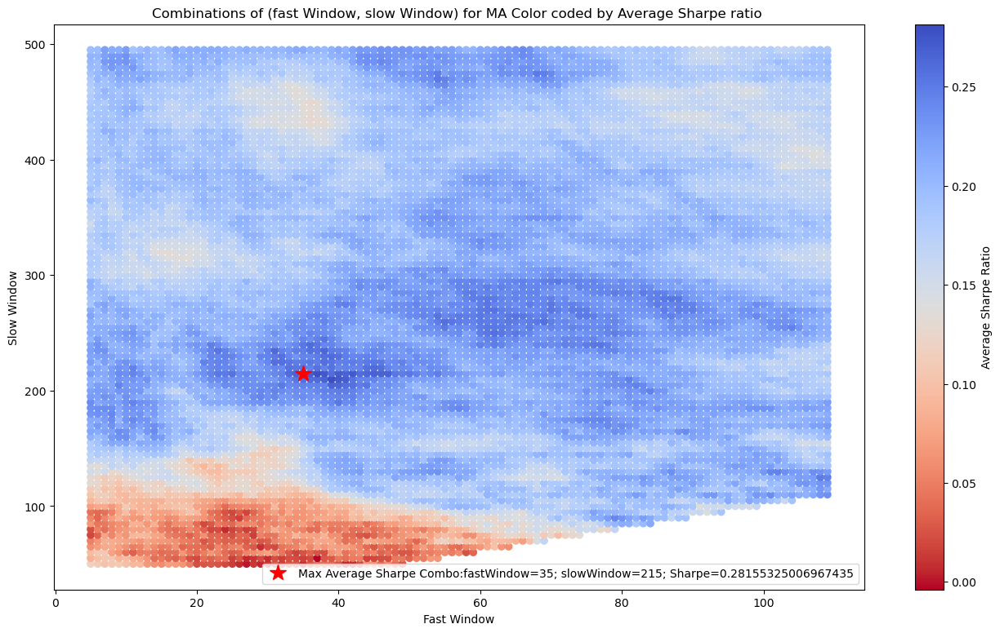

In [13]:
plt.figure(figsize=aspect_ratio)
ax = plt.subplot()
plt.scatter(comb[:, 0], comb[:, 1], c = avg_sharpe_arr, marker='o', cmap='coolwarm_r')
plt.title('Combinations of (fast Window, slow Window) for MA Color coded by Average Sharpe ratio ')
plt.xlabel('Fast Window')
plt.ylabel('Slow Window')
plt.colorbar(label='Average Sharpe Ratio')
plt.plot(comb[np.argmax(avg_sharpe_arr), 0], comb[np.argmax(avg_sharpe_arr), 1], 'r*', markersize=15.0, label=f'Max Average Sharpe Combo:fastWindow={comb[np.argmax(avg_sharpe_arr), 0]}; slowWindow={comb[np.argmax(avg_sharpe_arr), 1]}; Sharpe={max(avg_sharpe_arr)}')
plt.legend()

The red star (which represents the portfolio with the best Sharpe) is in a stable region. It is not too close to the portfolios with bad Sharpe.

The reason why we chose average instead of some other statistics like median is that for each value of slow window and fast window, we want the resultant sharpe to be affected by outliers, i.e, securities with high Sharpe.

We'll make the fast window-slow window plot for each security and mark the portfolio with the best Sharpe with a red star. The green star represents the portfolio with the highest average Sharpe across all securities.

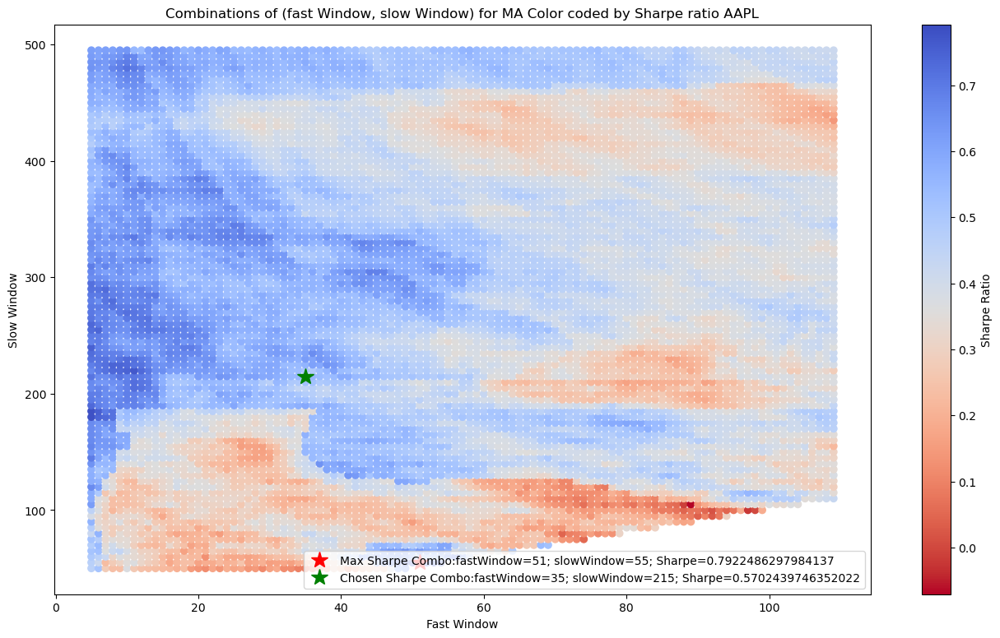

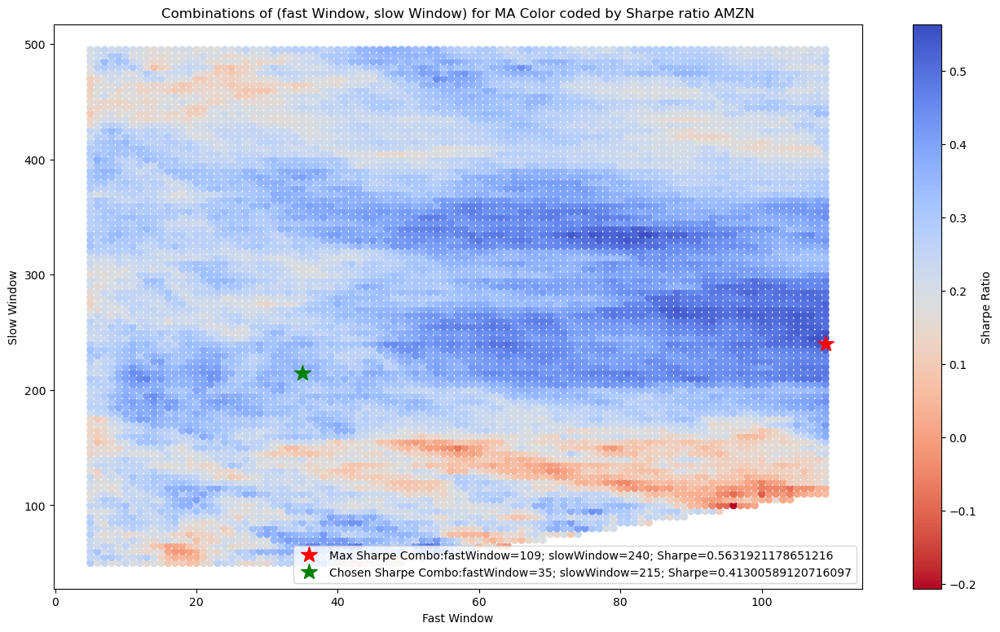

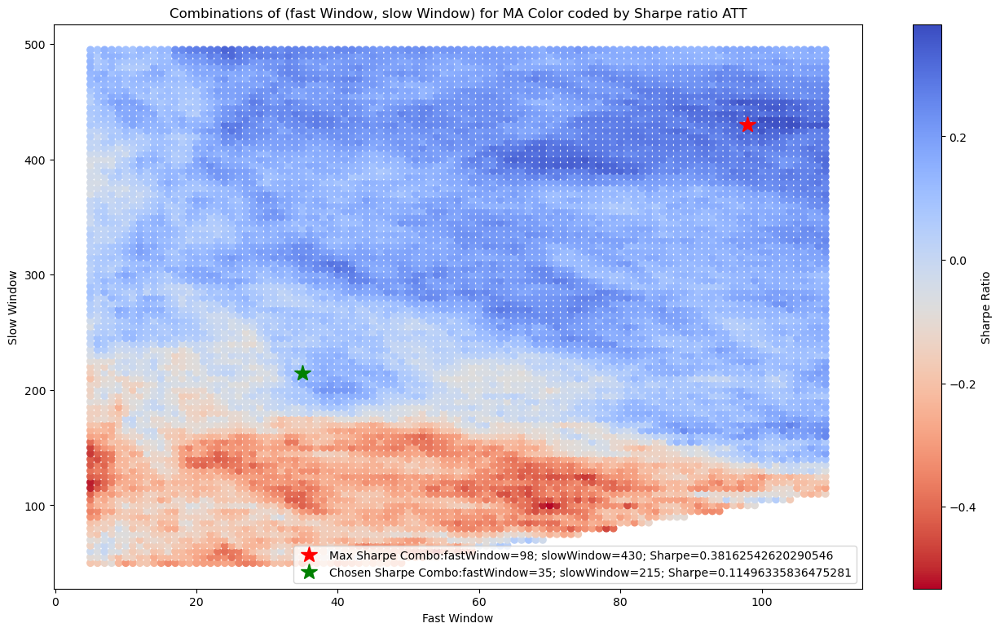

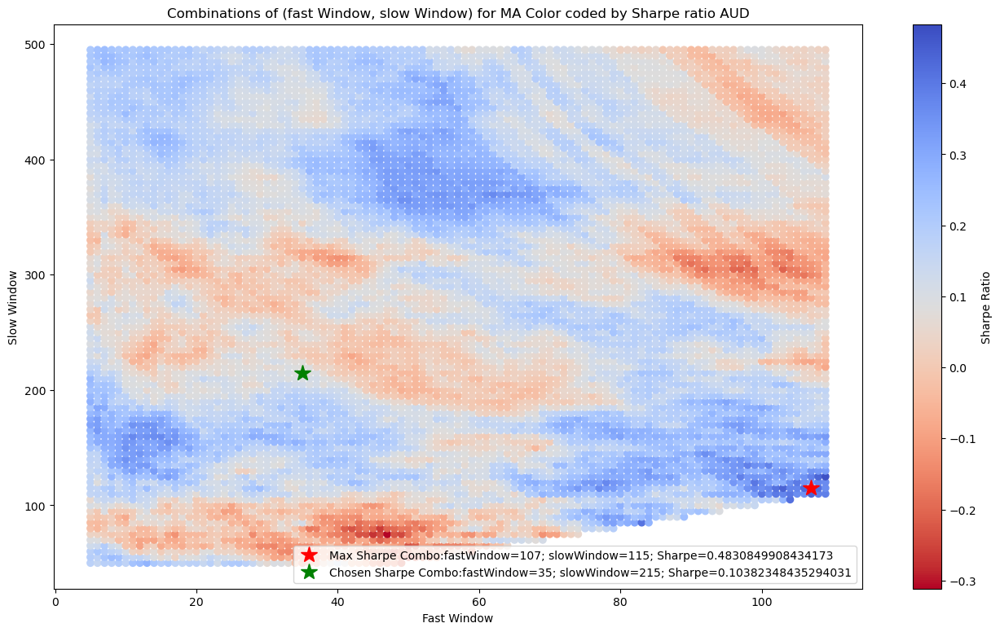

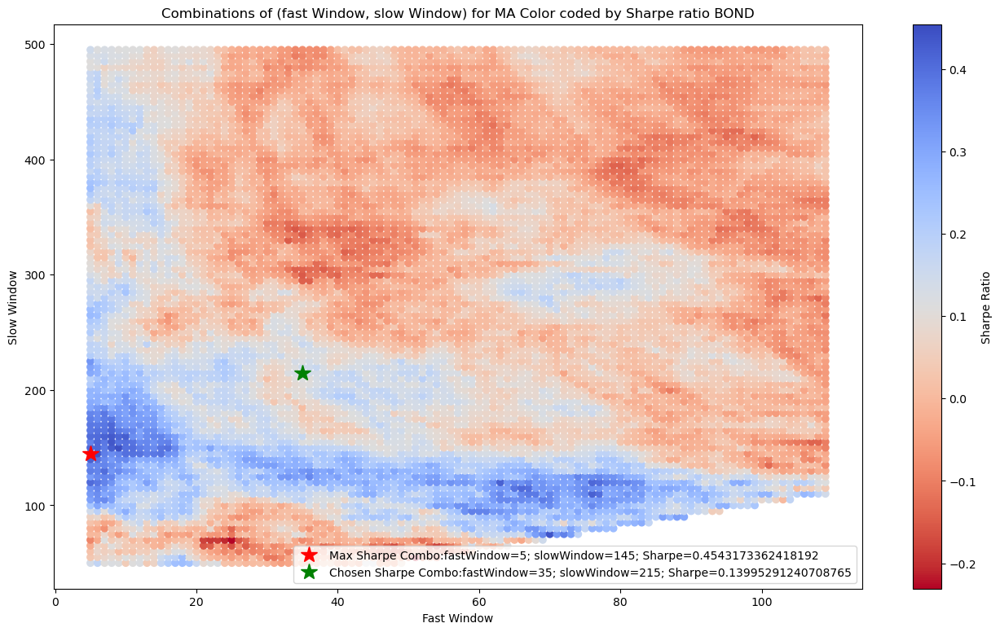

...

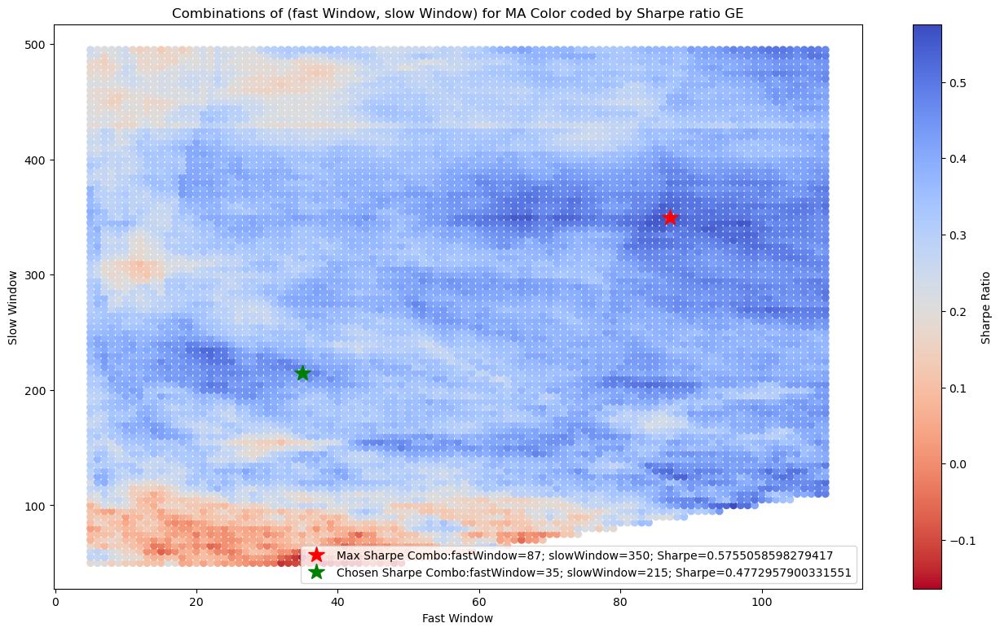

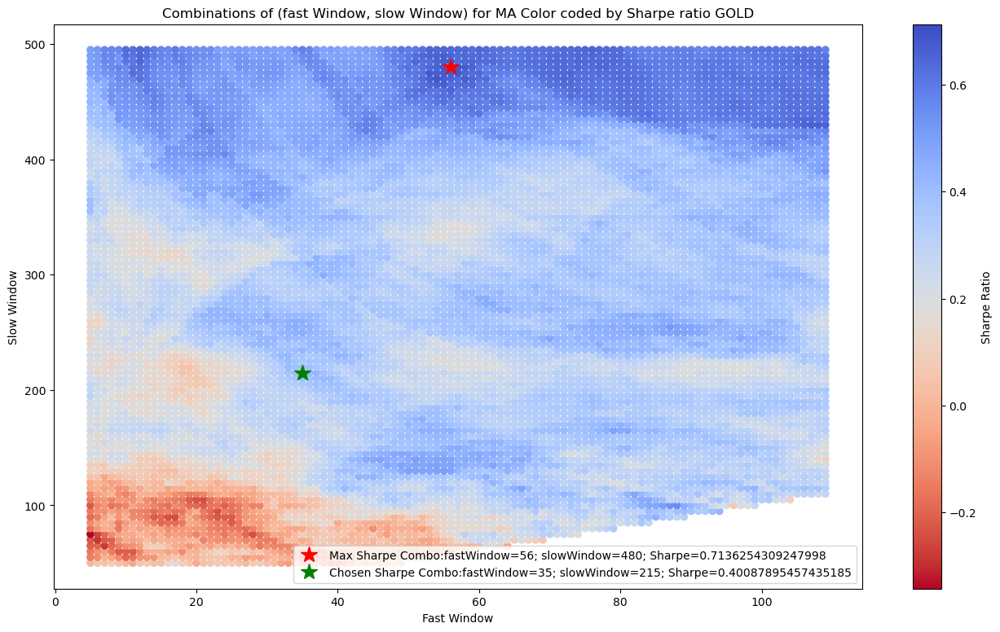

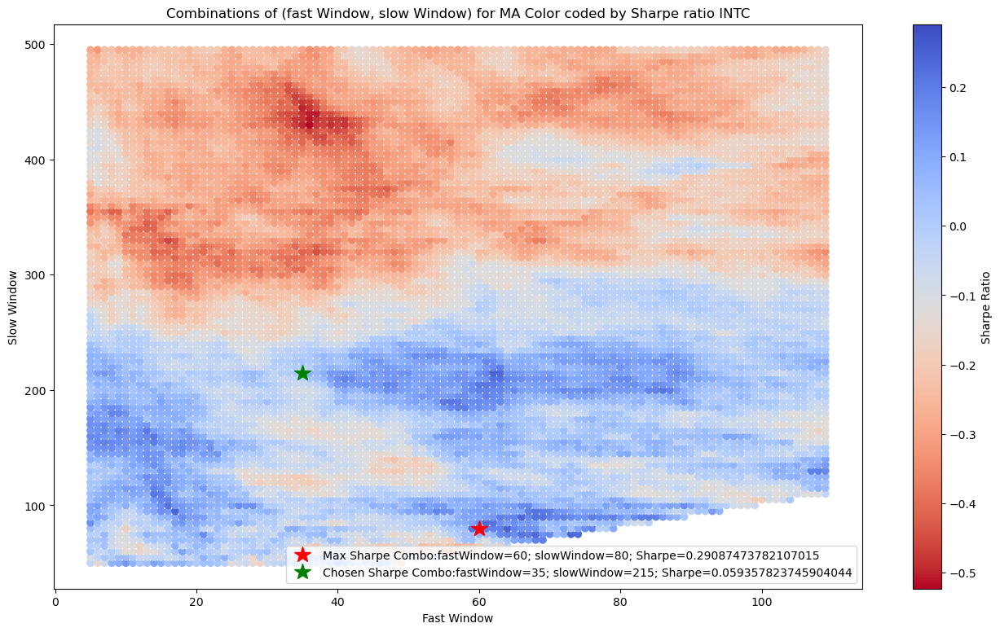

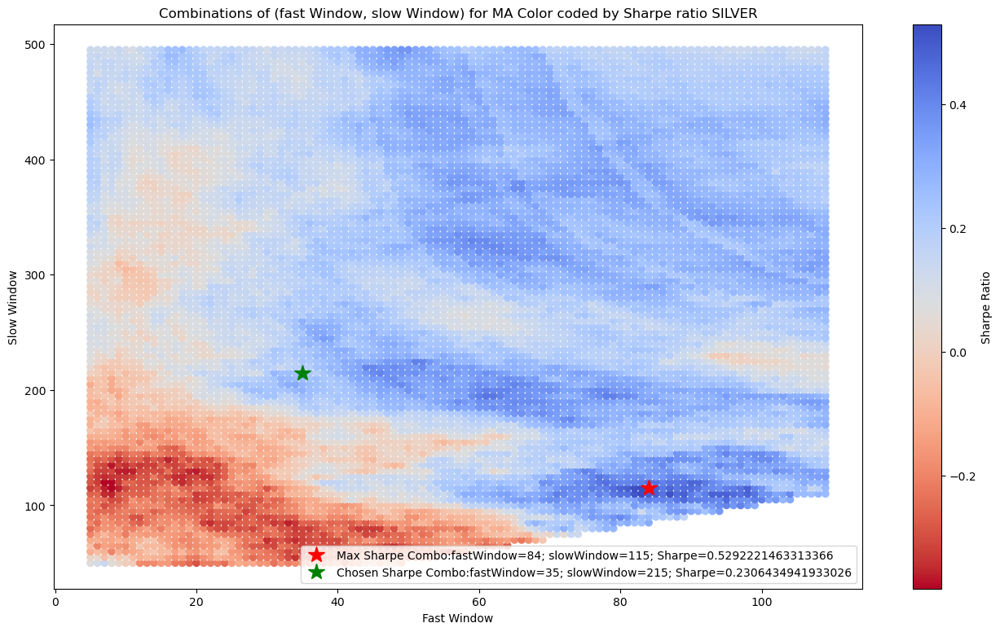

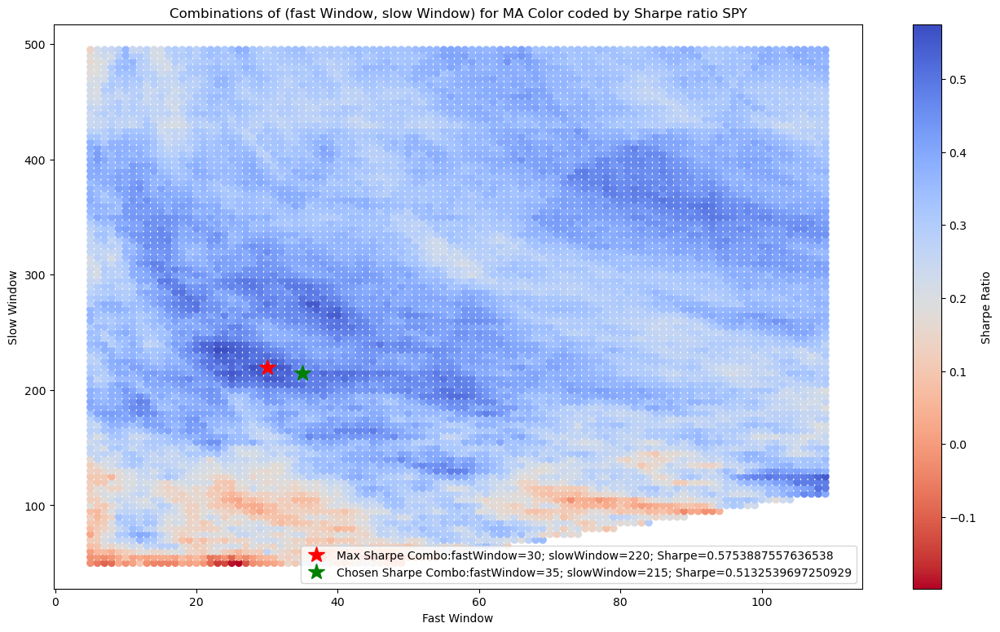

In [14]:
for j in range(len(dfPrices.columns)):
    plt.figure(figsize=aspect_ratio)
    ax = plt.subplot()
    plt.scatter(comb[:, 0], comb[:, 1], c = sharpe_arr_list[j], marker='o', cmap='coolwarm_r')
    plt.title('Combinations of (fast Window, slow Window) for MA Color coded by Sharpe ratio ' + dfPrices.columns[j])
    plt.xlabel('Fast Window')
    plt.ylabel('Slow Window')
    plt.colorbar(label='Sharpe Ratio')
    plt.plot(comb[np.argmax(sharpe_arr_list[j]), 0], comb[np.argmax(sharpe_arr_list[j]), 1], 'r*', markersize=15.0, label=f'Max Sharpe Combo:fastWindow={comb[np.argmax(sharpe_arr_list[j]), 0]}; slowWindow={comb[np.argmax(sharpe_arr_list[j]), 1]}; Sharpe={max(sharpe_arr_list[j])}')
    plt.plot(comb[np.argmax(avg_sharpe_arr), 0], comb[np.argmax(avg_sharpe_arr), 1], 'g*', markersize=15.0, label=f'Chosen Sharpe Combo:fastWindow={comb[np.argmax(avg_sharpe_arr), 0]}; slowWindow={comb[np.argmax(avg_sharpe_arr), 1]}; Sharpe={sharpe_arr_list[j][np.argmax(avg_sharpe_arr)]}')
    plt.legend()

#### Moving Average Crossover Strategy (Go Flat)

We'll repeat the same process for Go Flat strategy as well.

In [15]:
sharpe_arr_list = []

In [16]:
for j in range(len(dfPrices.columns)): # Iterate through securities
    sharpe = []
    for i in range(len(comb)): # Iterate through window sizes
        temp_df = movingAverageCrossover(dfPrices.iloc[:,j].to_frame(), fastWindow = comb[i, 0], slowWindow = comb[i, 1], flatOrShort = 0)[['SMAReturns']]
        sharpe.append(calculateSharpe(temp_df))
    sharpe_arr_list.append(np.array(sharpe.copy()))

`avg_sharpe_arr` is an array that contains the average Sharpe of all securities for each combination of slow window and fast window.

In [17]:
avg_sharpe_arr = sum(sharpe_arr_list)/len(sharpe_arr_list)

Let us examine the plot of the average Sharpes for each combination of slow window and fast window.

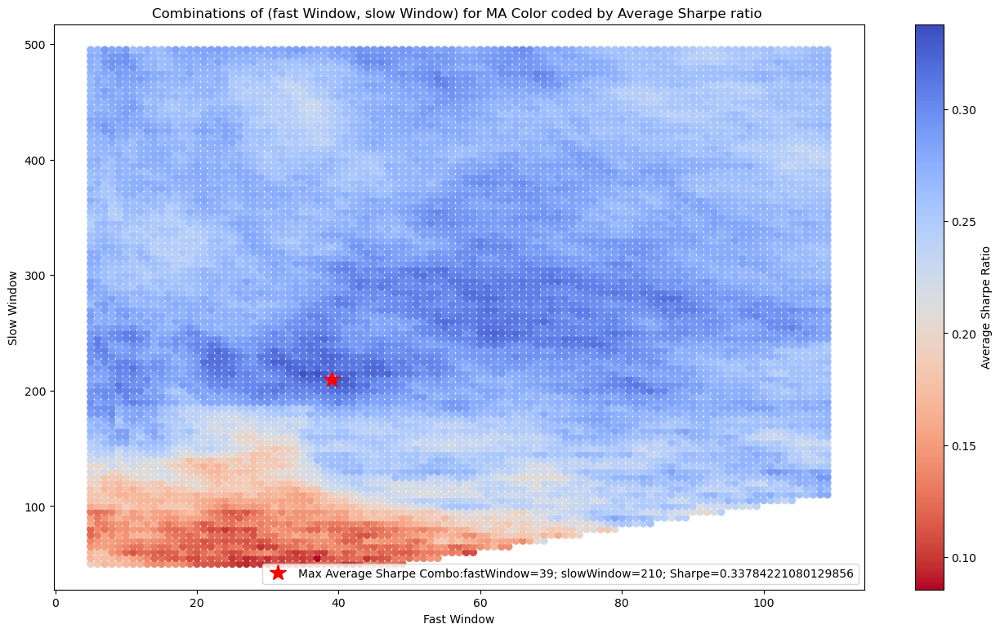

In [18]:
plt.figure(figsize=aspect_ratio)
ax = plt.subplot()
plt.scatter(comb[:, 0], comb[:, 1], c = avg_sharpe_arr, marker='o', cmap='coolwarm_r')
plt.title('Combinations of (fast Window, slow Window) for MA Color coded by Average Sharpe ratio ')
plt.xlabel('Fast Window')
plt.ylabel('Slow Window')
plt.colorbar(label='Average Sharpe Ratio')
plt.plot(comb[np.argmax(avg_sharpe_arr), 0], comb[np.argmax(avg_sharpe_arr), 1], 'r*', markersize=15.0, label=f'Max Average Sharpe Combo:fastWindow={comb[np.argmax(avg_sharpe_arr), 0]}; slowWindow={comb[np.argmax(avg_sharpe_arr), 1]}; Sharpe={max(avg_sharpe_arr)}')
plt.legend()

The red star (which represents the portfolio with the best Sharpe) is in a stable region. It is not too close to the portfolios with bad Sharpe.

The reason why we chose average instead of some other statistics like median is that for each value of slow window and fast window, we want the resultant sharpe to be affected by outliers, i.e, securities with high Sharpe.

We'll make the fast window-slow window plot for each security and mark the portfolio with the best Sharpe with a red star. The green star represents the portfolio with the highest average Sharpe across all securities.

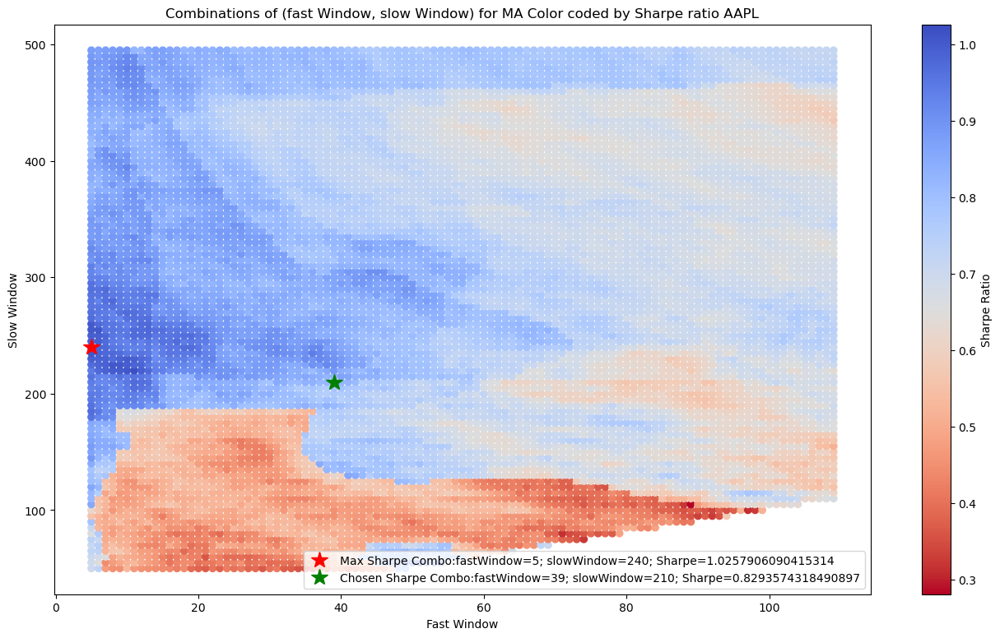

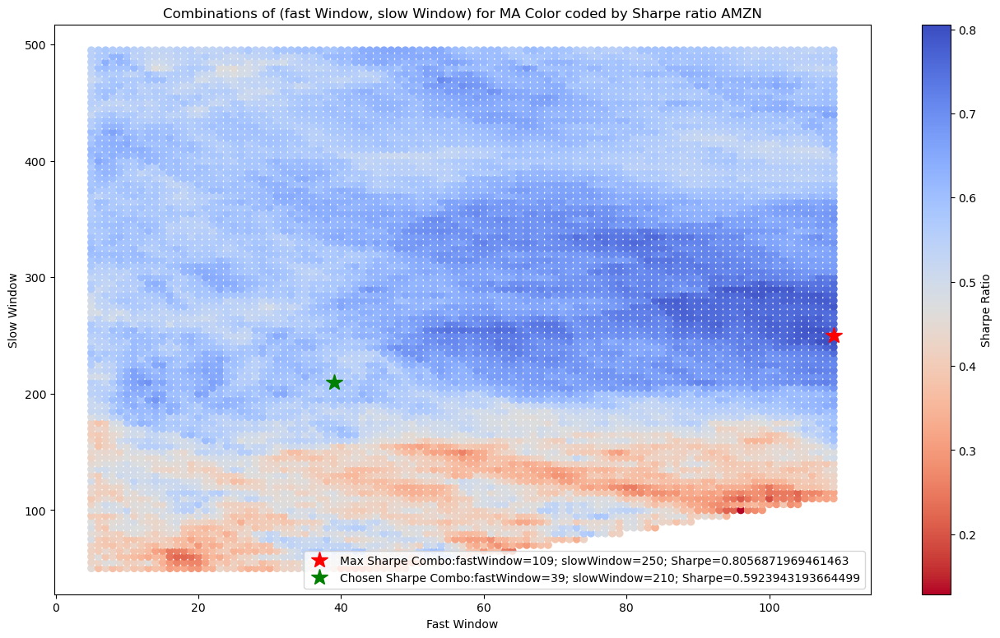

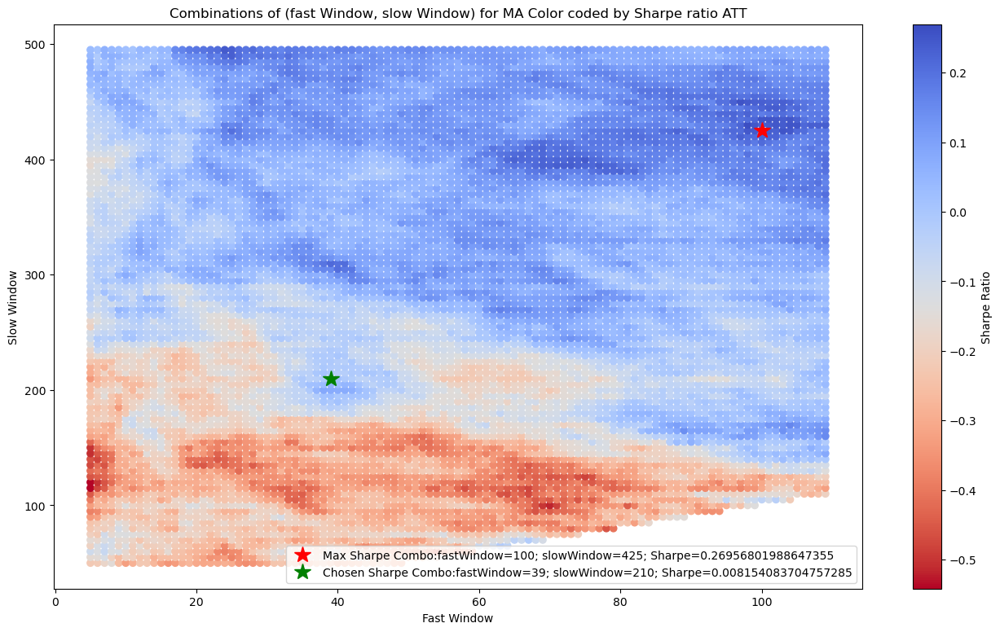

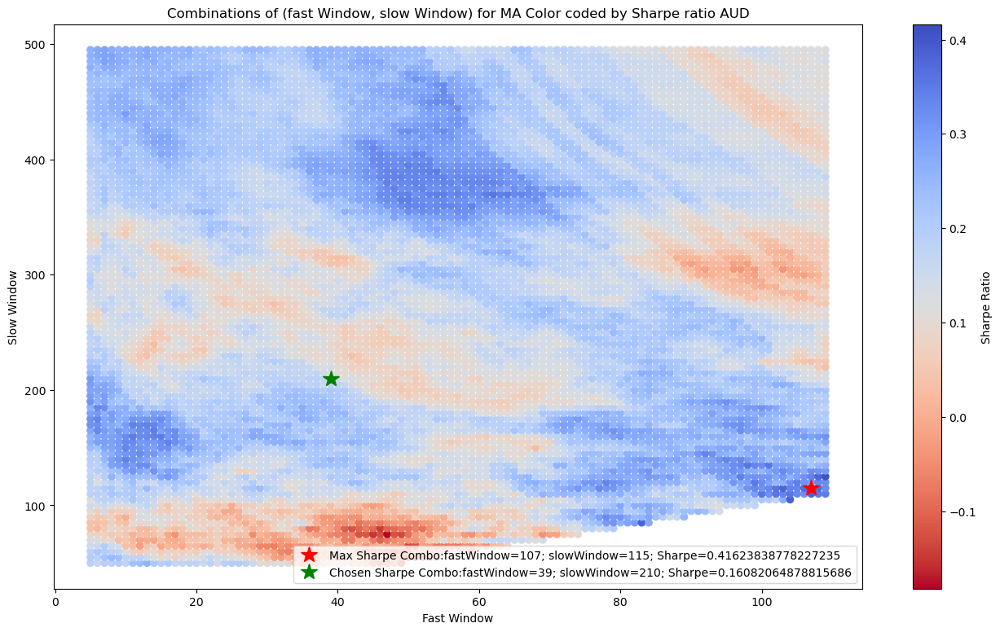

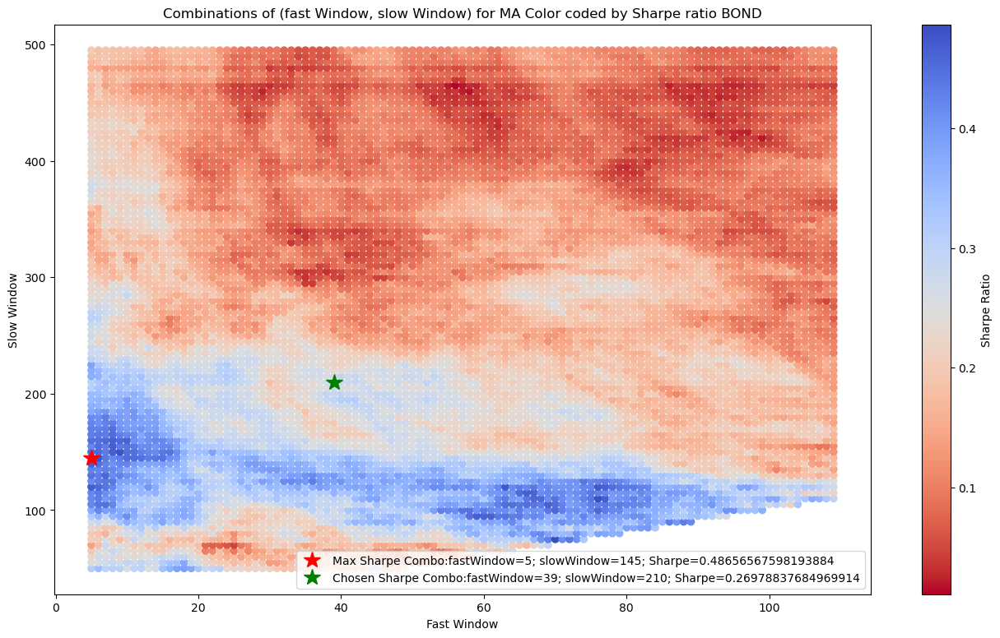

...

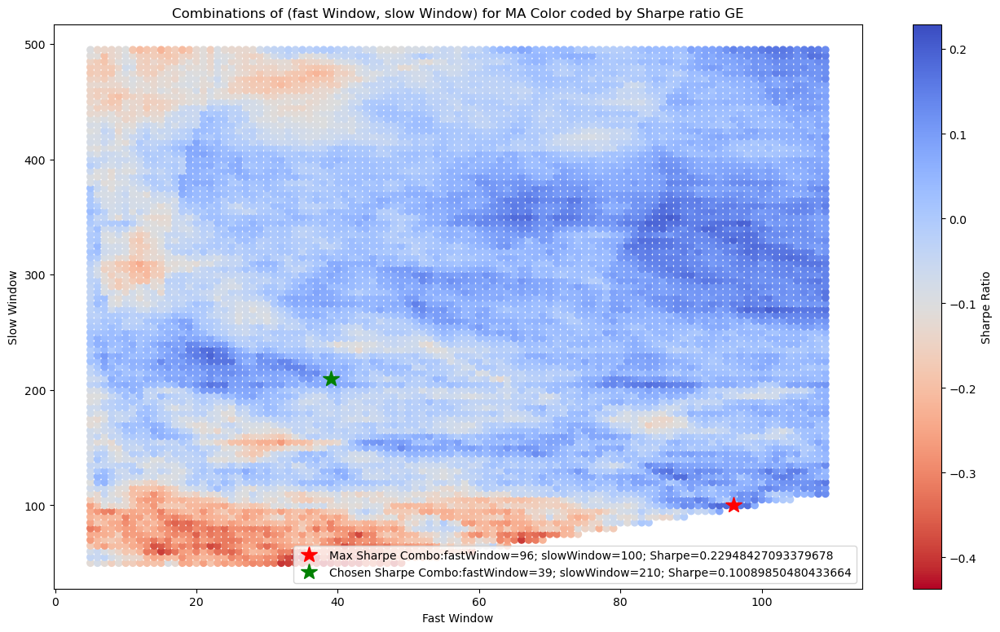

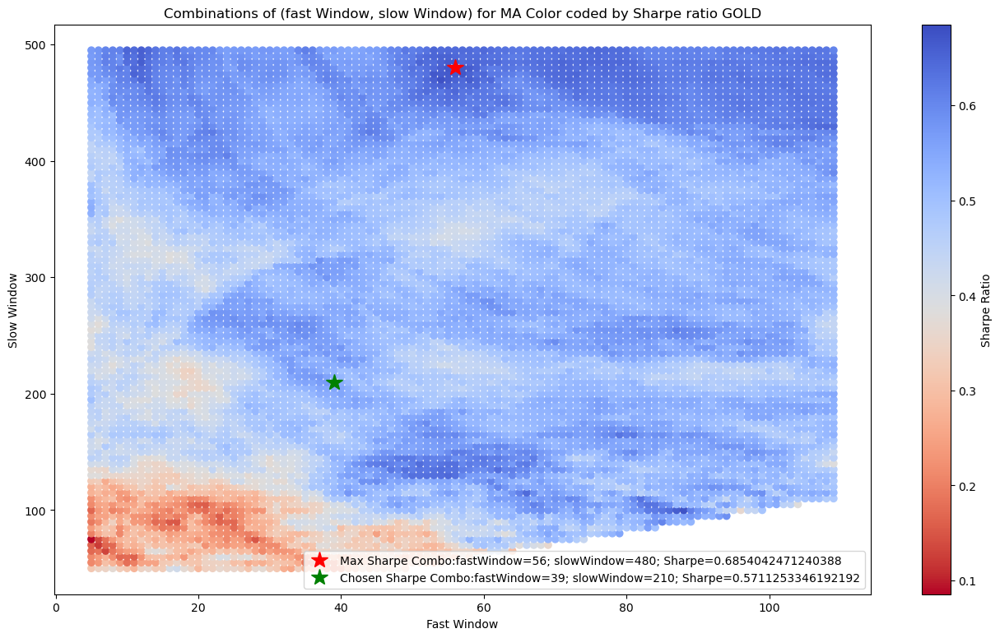

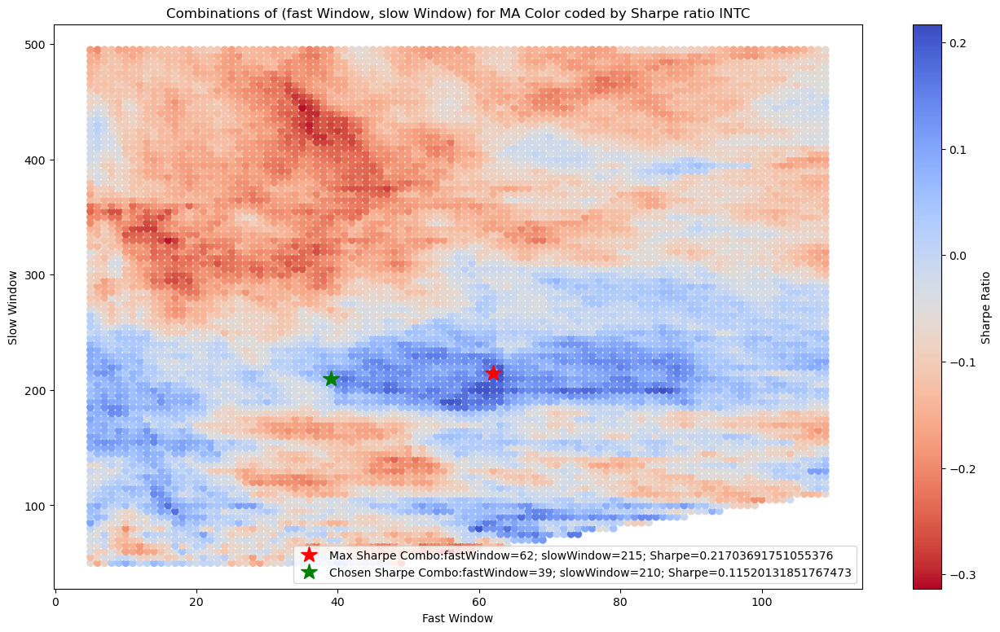

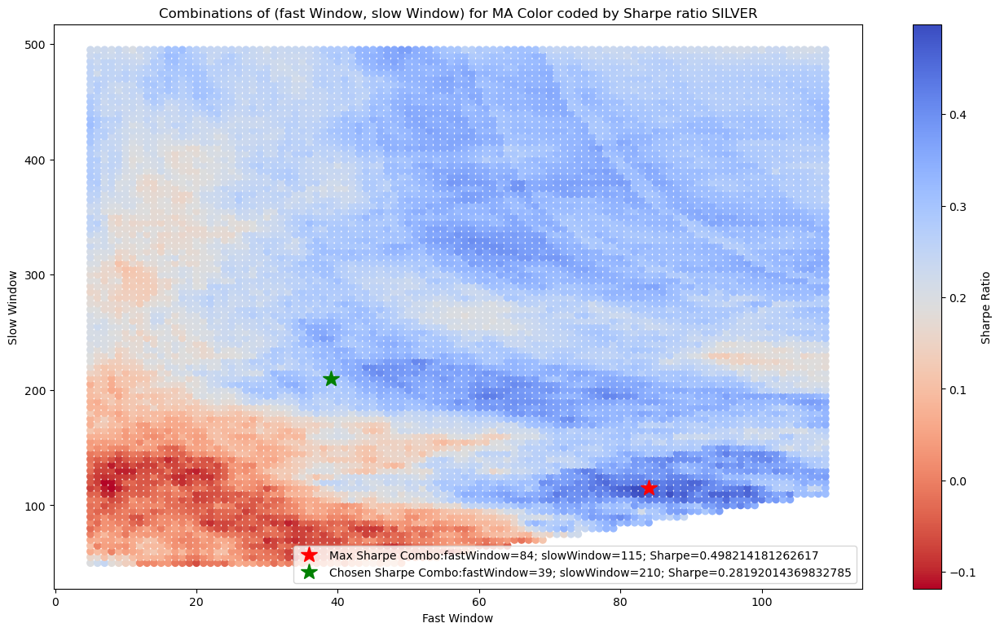

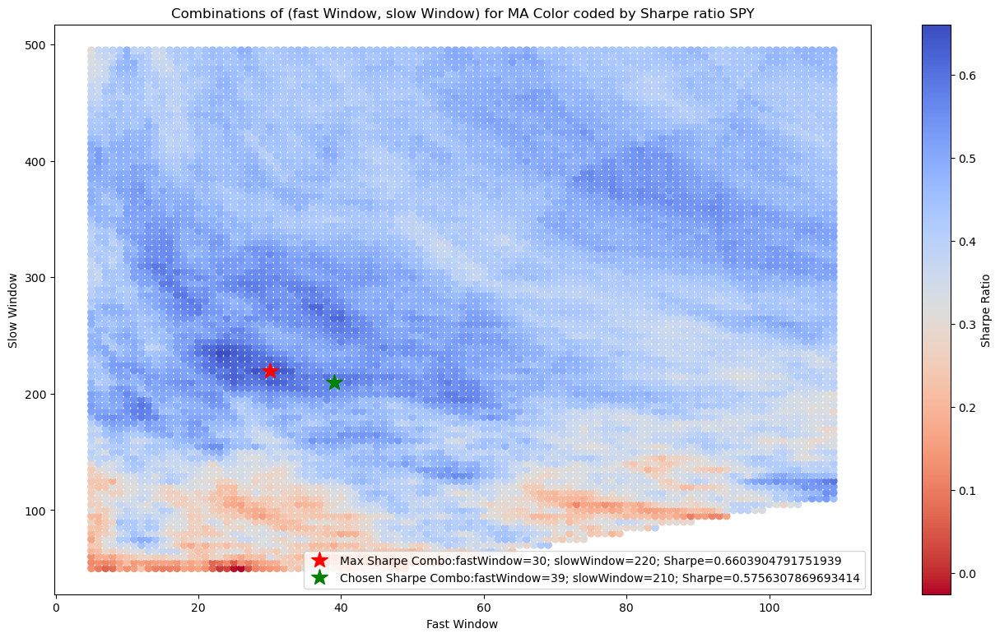

In [19]:
for j in range(len(dfPrices.columns)):
    plt.figure(figsize=aspect_ratio)
    ax = plt.subplot()
    plt.scatter(comb[:, 0], comb[:, 1], c = sharpe_arr_list[j], marker='o', cmap='coolwarm_r')
    plt.title('Combinations of (fast Window, slow Window) for MA Color coded by Sharpe ratio ' + dfPrices.columns[j])
    plt.xlabel('Fast Window')
    plt.ylabel('Slow Window')
    plt.colorbar(label='Sharpe Ratio')
    plt.plot(comb[np.argmax(sharpe_arr_list[j]), 0], comb[np.argmax(sharpe_arr_list[j]), 1], 'r*', markersize=15.0, label=f'Max Sharpe Combo:fastWindow={comb[np.argmax(sharpe_arr_list[j]), 0]}; slowWindow={comb[np.argmax(sharpe_arr_list[j]), 1]}; Sharpe={max(sharpe_arr_list[j])}')
    plt.plot(comb[np.argmax(avg_sharpe_arr), 0], comb[np.argmax(avg_sharpe_arr), 1], 'g*', markersize=15.0, label=f'Chosen Sharpe Combo:fastWindow={comb[np.argmax(avg_sharpe_arr), 0]}; slowWindow={comb[np.argmax(avg_sharpe_arr), 1]}; Sharpe={sharpe_arr_list[j][np.argmax(avg_sharpe_arr)]}')
    plt.legend()

#### Bollinger Band Strategy

Let us run Bollinger Band strategy for all the securities.

In [20]:
def bollingerBands(dataFrame, colname, lookbackWindow, stdevBand):
    dataFrame = dataFrame.copy()   # We don't want to affect the original data frame
    dataFrame.loc[:,'Mean'] = dataFrame[colname].rolling(lookbackWindow).mean()
    dataFrame.loc[:,'Stdev'] = dataFrame[colname].rolling(lookbackWindow).std()
    dataFrame.loc[:,'Upper'] = dataFrame['Mean'] + stdevBand * dataFrame['Stdev']
    dataFrame.loc[:,'Lower'] = dataFrame['Mean'] - stdevBand * dataFrame['Stdev']
    dataFrame.dropna(inplace=True)

    date0 = dataFrame.index[0]
    if dataFrame.loc[date0, colname] >= dataFrame.loc[date0, 'Upper']:
        dataFrame.loc[date0, 'Position'] = -1
    elif dataFrame.loc[date0, colname] <= dataFrame.loc[date0,'Lower']:
        dataFrame.loc[date0, 'Position'] = 1
    else:
        dataFrame.loc[date0, 'Position'] = 0

    for i in range(1, dataFrame.shape[0]):
        today=dataFrame.index[i]
        yesterday=dataFrame.index[i-1]
        if dataFrame.loc[today,colname] >= dataFrame.loc[today,'Upper']: 
            dataFrame.loc[today,'Position'] = -1 
        elif dataFrame.loc[today,colname] <= dataFrame.loc[today,'Lower']: 
            dataFrame.loc[today,'Position'] = 1 
        elif dataFrame.loc[yesterday,'Position'] == -1 and dataFrame.loc[today, colname] <= dataFrame.loc[today,'Mean']:
            dataFrame.loc[today,'Position']=0
        elif dataFrame.loc[yesterday,'Position'] == 1 and dataFrame.loc[today, colname] >= dataFrame.loc[today, 'Mean']:
            dataFrame.loc[today,'Position']=0
        else:
            dataFrame.loc[today,'Position']=dataFrame.loc[yesterday,'Position']

    dataFrame.loc[:,'OriginalReturns'] = np.log(dataFrame[colname] / dataFrame[colname].shift(1))
    dataFrame.loc[:,'BBReturns'] = dataFrame['Position'].shift(1) * dataFrame['OriginalReturns']
    dataFrame.dropna(inplace=True)
    return dataFrame[['OriginalReturns', 'BBReturns']]

Lookback window is 20 and number of standard deviations is 2. We'll run Bollinger Band strategy for each security and store the Sharpe values to `bb_sharpe`.

In [21]:
bb_sharpe = []

In [22]:
for j in range(len(dfPrices.columns)):
    temp_df = bollingerBands(dfPrices.iloc[:,j].to_frame(), dfPrices.columns[j], lookbackWindow = 20, stdevBand = 2)[['BBReturns']]
    bb_sharpe.append(calculateSharpe(temp_df))

Now, we'll view the results of those securities where the Sharpe is positive.

In [23]:
for i in zip(dfPrices.columns, bb_sharpe):
    if(i[1] > 0):
        print(str(i) + '\n')

('AMZN', 0.25830936945882765)

('ATT', 0.2139993324026676)

('GOLD', 0.08129194925196002)

('INTC', 0.3131794289526227)

('SPY', 0.32460840323153745)



`AMZN`, `ATT` and `INTC` seem to perform well. Let us look at the close price plots of these securities.

<u>Price plot of `ATT`</u>

<AxesSubplot:title={'center':'Simple Price Chart'}, ylabel='Price'>

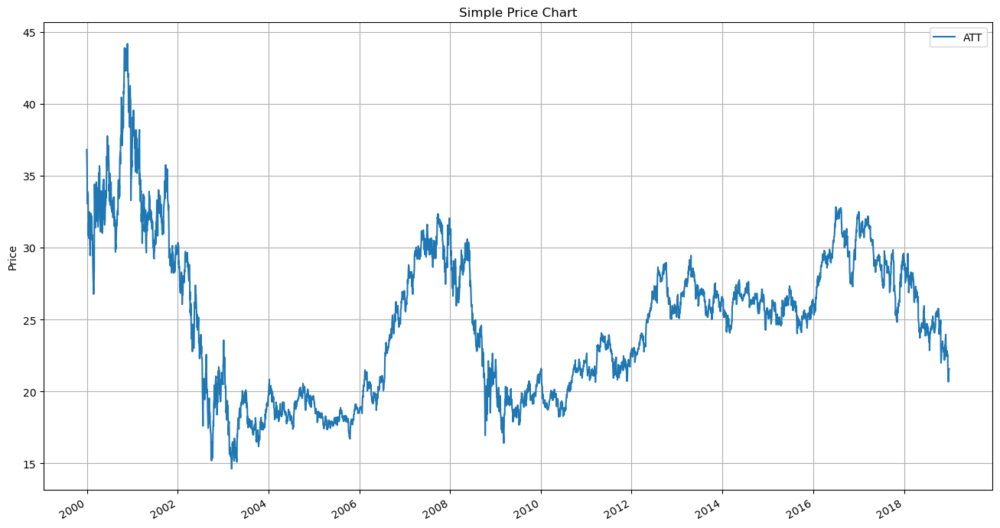

In [24]:
dfPrices[['ATT']].plot(figsize = aspect_ratio, title='Simple Price Chart', ylabel='Price', grid=True)

<u>Price plot of `AMZN`</u>

<AxesSubplot:title={'center':'Simple Price Chart'}, ylabel='Price'>

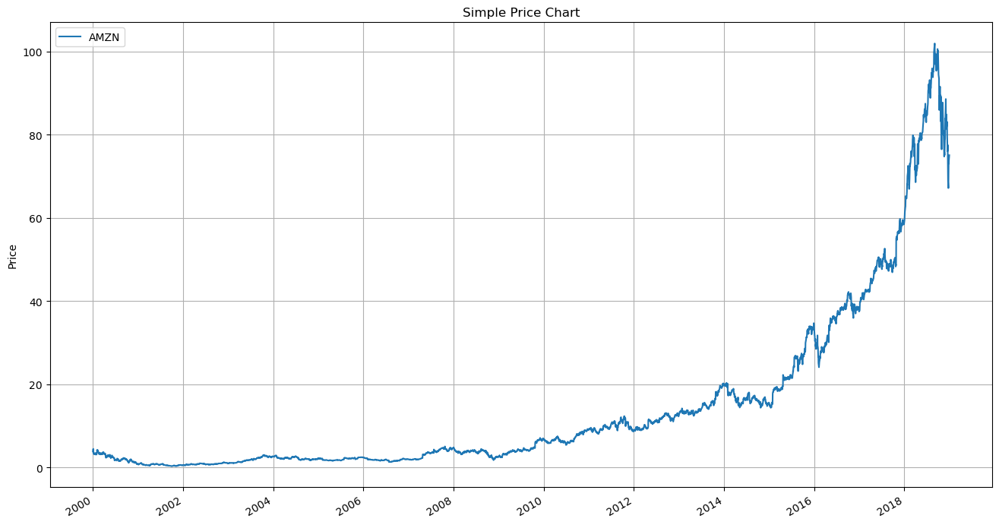

In [25]:
dfPrices[['AMZN']].plot(figsize = aspect_ratio, title='Simple Price Chart', ylabel='Price', grid=True)

<u>Price plot of `INTC`</u>

<AxesSubplot:title={'center':'Simple Price Chart'}, ylabel='Price'>

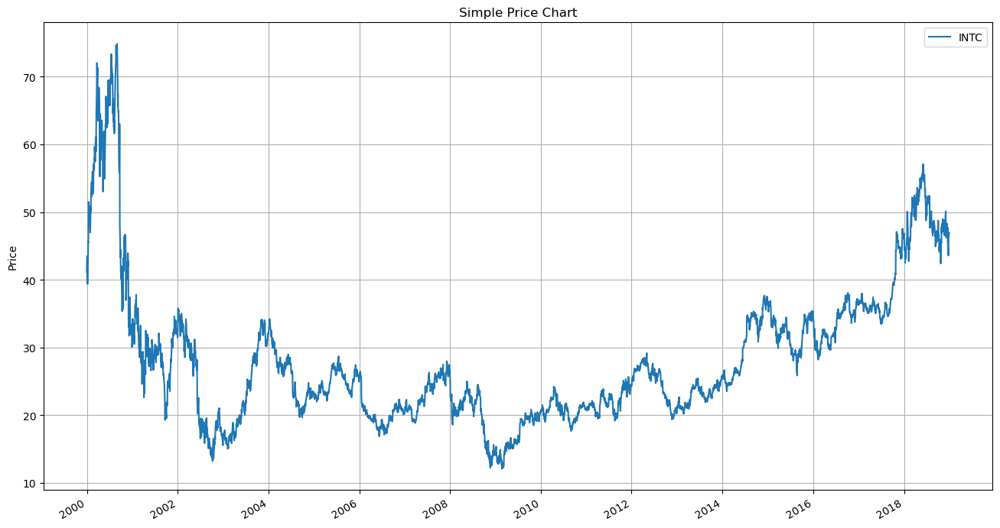

In [26]:
dfPrices[['INTC']].plot(figsize = aspect_ratio, title='Simple Price Chart', ylabel='Price', grid=True)

`ATT` seems like a good candidate for bollinger band strategy.<br>
For `AMZN`, there is an upward trend over the past decade so a trending strategy would be better.<br>
For `INTC`, although the bollinger band strategy gives the best Sharpe, there is an upward trend over the past decade like `AMZN` so a trending strategy would be better.

#### No strategy

Finally, we'll check the sharpe ratios of the securities without applying any strategy.

In [27]:
logReturns_no_strategy = np.log(dfPrices/ dfPrices.shift(1)).dropna()
np.sqrt(annualization_factor) * logReturns_no_strategy.mean() / logReturns_no_strategy.std() # Annualized Sharpes

AAPL      0.475834
AMZN      0.304578
ATT      -0.110222
AUD       0.029530
BOND      0.331122
EUR       0.070168
GE       -0.334616
GOLD      0.459479
INTC      0.018933
SILVER    0.190360
SPY       0.148482
dtype: float64

The Sharpe ratios are quite low.

---
# 2

#### Final combination

We chose the following strategies after considering the chosen portfolio Sharpe values in the above analyses.

AAPL - Go Flat<br>
AMZN - Go Flat<br>
ATT - Bollinger Band<br>
AUD - Go Flat<br>
BOND - No strategy<br>
EUR - Go Flat<br>
GE - Go Short<br>
GOLD - Go Flat<br>
INTC - Go Flat<br>
SILVER - Go Flat<br>
SPY - Go Flat

Final window sizes are (39, 210). We chose these window sizes as these are the optimal sizes in the Go Flat strategy. We didn't use the sizes from Go Short strategy as there is only one security for which that strategy applies.

#### Creating the dataframe of logReturns for each security

We'll calculate the log returns of those securities in the Go Flat strategy.

In [28]:
dfGoFlat = dfPrices[['AAPL', 'AMZN', 'AUD', 'EUR', 'GOLD', 'INTC', 'SILVER', 'SPY']]
dfGoFlat

,AAPL,AMZN,AUD,EUR,GOLD,INTC,SILVER,SPY
1999-12-31,0.917969,3.806250,0.6567,1.0062,288.00,41.156250,5.3800,146.875000
2000-01-03,0.999442,4.468750,0.6585,1.0243,289.00,43.500000,5.4050,145.437500
2000-01-04,0.915179,4.096875,0.6550,1.0296,282.25,41.468750,5.3250,139.750000
2000-01-05,0.928571,3.487500,0.6579,1.0321,280.00,41.812500,5.1450,140.000000
2000-01-06,0.848214,3.278125,0.6533,1.0328,281.10,39.375000,5.1200,137.750000
...,...,...,...,...,...,...,...,...
2018-12-24,36.707500,67.197998,0.7049,1.1406,1269.22,43.590000,14.7750,234.339996
2018-12-26,39.292500,73.544998,0.7066,1.1353,1267.14,46.189999,15.0355,246.179993
2018-12-27,39.037498,73.082001,0.7033,1.1430,1275.71,46.360001,15.2275,248.070007
2018-12-28,39.057499,73.901001,0.7047,1.1444,1280.71,46.750000,15.3839,247.750000


In [29]:
logReturnGoFlat = dfGoFlat.copy()
for j in range(len(dfGoFlat.columns)):
    logReturnGoFlat.iloc[:,j] = movingAverageCrossover(dfGoFlat.iloc[:,j].to_frame(), fastWindow = 39, slowWindow = 210, flatOrShort = 0)['SMAReturns']

In [30]:
logReturnGoFlat # NaNs are at the beginning because of the windows

,AAPL,AMZN,AUD,EUR,GOLD,INTC,SILVER,SPY
1999-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,0.0,0.0,0.0,-0.0,0.0,-0.0
2018-12-26,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,0.0
2018-12-27,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0
2018-12-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0


Next, we'll compute the log returns of those securities in the Go Short strategy.

In [31]:
dfGoShort = dfPrices[['GE']]
dfGoShort

,GE
1999-12-31,396.794861
2000-01-03,384.615387
2000-01-04,369.230774
2000-01-05,368.589752
2000-01-06,373.517639
...,...
2018-12-24,53.230770
2018-12-26,56.846153
2018-12-27,55.923077
2018-12-28,57.769230


In [32]:
logReturnGoShort = dfGoShort.copy()
for j in range(len(dfGoShort.columns)):
    logReturnGoShort.iloc[:,j] = movingAverageCrossover(dfGoShort.iloc[:,j].to_frame(), fastWindow = 39, slowWindow = 210, flatOrShort = -1)['SMAReturns']

In [33]:
logReturnGoShort

,GE
1999-12-31,NaN
2000-01-03,NaN
2000-01-04,NaN
2000-01-05,NaN
2000-01-06,NaN
...,...
2018-12-24,0.032697
2018-12-26,-0.065712
2018-12-27,0.016371
2018-12-28,-0.032479


Now, we'll compute the log returns of those securities in the Bollinger Band strategy.

In [34]:
dfBollingerBand = dfPrices[['ATT']]
dfBollingerBand

,ATT
1999-12-31,36.820244
2000-01-03,35.498489
2000-01-04,33.421452
2000-01-05,33.940708
2000-01-06,33.043808
...,...
2018-12-24,20.664654
2018-12-26,21.208460
2018-12-27,21.261330
2018-12-28,21.495468


In [35]:
logReturnBB = dfBollingerBand.copy()
for j in range(len(dfBollingerBand.columns)):
    logReturnBB.iloc[:,j] = bollingerBands(dfBollingerBand.iloc[:,j].to_frame(), dfBollingerBand.columns[j], lookbackWindow = 20, stdevBand = 2)[['BBReturns']]

In [36]:
logReturnBB

,ATT
1999-12-31,NaN
2000-01-03,NaN
2000-01-04,NaN
2000-01-05,NaN
2000-01-06,NaN
...,...
2018-12-24,-0.034133
2018-12-26,0.025975
2018-12-27,0.002490
2018-12-28,0.010952


We'll compute the log returns of those securities to which no strategy is applied.

In [37]:
dfNoStrategy = dfPrices[['BOND']]
dfNoStrategy

,BOND
1999-12-31,798.154631
2000-01-03,793.868670
2000-01-04,796.761677
2000-01-05,793.118215
2000-01-06,795.091984
...,...
2018-12-24,998.805410
2018-12-26,996.301026
2018-12-27,998.396182
2018-12-28,998.680796


In [38]:
logReturnNoStrategy = np.log(dfNoStrategy/ dfNoStrategy.shift(1)).copy()
logReturnNoStrategy

,BOND
1999-12-31,NaN
2000-01-03,-0.005384
2000-01-04,0.003638
2000-01-05,-0.004583
2000-01-06,0.002486
...,...
2018-12-24,0.001688
2018-12-26,-0.002511
2018-12-27,0.002101
2018-12-28,0.000285


Now, we'll combine the log returns into a single data frame.

In [39]:
logReturnAll = pd.concat([logReturnGoFlat, logReturnGoShort, logReturnBB, logReturnNoStrategy], axis = 1)
logReturnAll

,AAPL,AMZN,AUD,EUR,GOLD,INTC,SILVER,SPY,GE,ATT,BOND
1999-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.005384
2000-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.003638
2000-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.004583
2000-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.002486
...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,0.032697,-0.034133,0.001688
2018-12-26,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,-0.065712,0.025975,-0.002511
2018-12-27,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.016371,0.002490,0.002101
2018-12-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.032479,0.010952,0.000285


Let us look at some summary statistics of these portfolios.

In [40]:
def calcSummaryStatistics(dF, annualization_factor=annualization_factor, percent_format_string=pct_format_2d):
    cumRtns = dF.cumsum()
    summary_stats = pd.DataFrame([annualization_factor*dF.mean(),
                                  np.sqrt(annualization_factor)*dF.std(),
                                  np.sqrt(annualization_factor) * dF.mean() / dF.std(),
                                  (cumRtns - np.maximum.accumulate(cumRtns)).min(axis=0),
                                  (dF >= 0).sum() / dF.shape[0]
                                 ],
                                 index=['Average Annual Return', 'Annual Risk', 'Sharpe Ratio', 'maxDD', 'Success Ratio']
                                )
    print_data_frame_pct(summary_stats, pct_format=percent_format_string, indexSlice=pd.IndexSlice[['Average Annual Return', 'Annual Risk', 'maxDD', 'Success Ratio'], :])

In [41]:
def print_data_frame_pct (dF, pct_format=pct_format_2d, nan='NaN', indexSlice=pd.IndexSlice[:,:]):
    display(dF.style.format(pct_format, na_rep=nan, subset=indexSlice))

In [42]:
calcSummaryStatistics(logReturnAll.dropna())

,AAPL,AMZN,AUD,EUR,GOLD,INTC,SILVER,SPY,GE,ATT,BOND
Average Annual Return,23.29%,19.67%,1.37%,1.52%,8.19%,2.36%,6.76%,6.42%,14.13%,4.38%,1.03%
Annual Risk,28.08%,33.20%,8.52%,7.19%,14.35%,20.44%,23.98%,11.16%,31.07%,19.27%,3.75%
Sharpe Ratio,0.829357,0.592394,0.160821,0.210973,0.571125,0.115201,0.281920,0.575631,0.454702,0.227073,0.274776
maxDD,-89.44%,-95.33%,-37.88%,-22.49%,-40.06%,-64.19%,-75.06%,-19.50%,-96.54%,-39.89%,-14.21%
Success Ratio,65.34%,67.25%,73.85%,70.69%,68.49%,73.74%,76.82%,69.77%,51.69%,74.40%,52.46%


We'll compute the correlation matrix.

In [43]:
print_data_frame_pct(logReturnAll.dropna().corr(), pct_format_2d)

,AAPL,AMZN,AUD,EUR,GOLD,INTC,SILVER,SPY,GE,ATT,BOND
AAPL,100.00%,27.88%,12.49%,1.70%,1.19%,32.99%,5.51%,41.37%,-2.79%,3.64%,-12.70%
AMZN,27.88%,100.00%,12.47%,0.33%,-1.16%,24.75%,3.21%,35.13%,-6.34%,7.96%,-14.06%
AUD,12.49%,12.47%,100.00%,47.65%,36.73%,16.59%,38.88%,32.65%,2.94%,3.49%,-1.30%
EUR,1.70%,0.33%,47.65%,100.00%,36.55%,3.05%,29.87%,12.99%,7.60%,-2.36%,14.21%
GOLD,1.19%,-1.16%,36.73%,36.55%,100.00%,1.41%,68.82%,5.61%,7.73%,-2.93%,13.49%
INTC,32.99%,24.75%,16.59%,3.05%,1.41%,100.00%,2.62%,46.96%,4.56%,5.50%,-14.39%
SILVER,5.51%,3.21%,38.88%,29.87%,68.82%,2.62%,100.00%,13.61%,3.62%,0.08%,4.21%
SPY,41.37%,35.13%,32.65%,12.99%,5.61%,46.96%,13.61%,100.00%,14.92%,8.92%,-18.03%
GE,-2.79%,-6.34%,2.94%,7.60%,7.73%,4.56%,3.62%,14.92%,100.00%,-8.05%,9.29%
ATT,3.64%,7.96%,3.49%,-2.36%,-2.93%,5.50%,0.08%,8.92%,-8.05%,100.00%,-2.72%


We have decided to remove `SILVER` since it is highly correlated with gold and has a lower Sharpe.<br>
We have decided to remove `AUD` since it has lower Sharpe and higher risk than `EUR`.<br>
We have decided to remove `INTC` since it is highly correlated with `SPY` and has lower Sharpe than `SPY`.

We'll reduce the pool to 8 securities.

In [44]:
logReturnFinal8 = logReturnAll[['AAPL', 'AMZN', 'EUR', 'GOLD', 'SPY', 'GE', 'ATT', 'BOND']].copy()
logReturnFinal8

,AAPL,AMZN,EUR,GOLD,SPY,GE,ATT,BOND
1999-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.005384
2000-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.003638
2000-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.004583
2000-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.002486
...,...,...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,0.0,0.0,-0.0,0.032697,-0.034133,0.001688
2018-12-26,0.0,0.0,-0.0,-0.0,0.0,-0.065712,0.025975,-0.002511
2018-12-27,-0.0,-0.0,0.0,0.0,0.0,0.016371,0.002490,0.002101
2018-12-28,0.0,0.0,0.0,0.0,-0.0,-0.032479,0.010952,0.000285


In [45]:
logReturnFinal8.dropna(inplace = True)

---
# 3

To maximize the Sharpe of the final portfolio, first we ran all strategies (Go Flat MA, Go Short MA, Bollinger Band and No Strategy) on all the securities. For each security, we chose the strategy that gave the best Sharpe.<br>
Since the slow window and fast window for MA strategy should be the same across all the securities, we did the following:
* Choose a strategy (say Go Flat)
* Create an array that contains the average Sharpe value across all securities for each combination of slow window and fast window.
* Create a plot using this array and check if the best portfolio is in a stable region.
* Repeat the above steps for the Go Short strategy.
* Now we got window sizes for both strategies.
* Interestingly, the window sizes were close (39, 210) (Flat) and (35, 215) (Short).

Now, for selecting a final strategy for an instrument, we ran all 4 algorithms (above window sizes were used for MA strategies) and picked the one with the best Sharpe. Since the majority of instruments use the Go Flat strategy, we finalized (39, 210) as the window size to be applied across all MA strategies.<br>
Bollinger Band strategy works best for `ATT` because there is no strong trend in its price chart.<br>
Finally, we created a correlation matrix and removed the securities that are highly correlated with other securities and have a low Sharpe.<br>
We have decided to remove `SILVER` since it is highly correlated with `GOLD` and has a lower Sharpe.<br>
We have decided to remove `AUD` since it has lower Sharpe and higher risk than `EUR`.<br>
We have decided to remove `INTC` since it is highly correlated with `SPY` and has lower Sharpe than `SPY`.

---
# 4

### Mean-Variance Optimization

We'll generate an efficient frontier using several weight combinations of the 8 securities. We will be using a 5000 step Monte Carlo simulation to compute the weights.

In [46]:
prets = []
pvols = []
all_wts = []
rng = np.random.default_rng(seed=42)
for iter in range(0, 5000): # Number of weight combinations = 5000
    wts = rng.random(logReturnFinal8.shape[1]) # Number of weights = number of securities
    wts /= np.sum(wts)
    prets.append(annualization_factor * np.dot(wts, logReturnFinal8.mean().T)) # Annual return of the portfolio is appended to prets
    pvols.append(np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(wts, logReturnFinal8.cov()), wts.T))) # Annual risk of the portfolio is appended to pvols
    all_wts.append(wts) # Weight combination is appended to all_wts
prets = np.array(prets)
pvols = np.array(pvols)
all_wts = np.array(all_wts)

---
# 5 to 8
We'll plot the risk/ return scatter plot of all the 5000 portfolios.

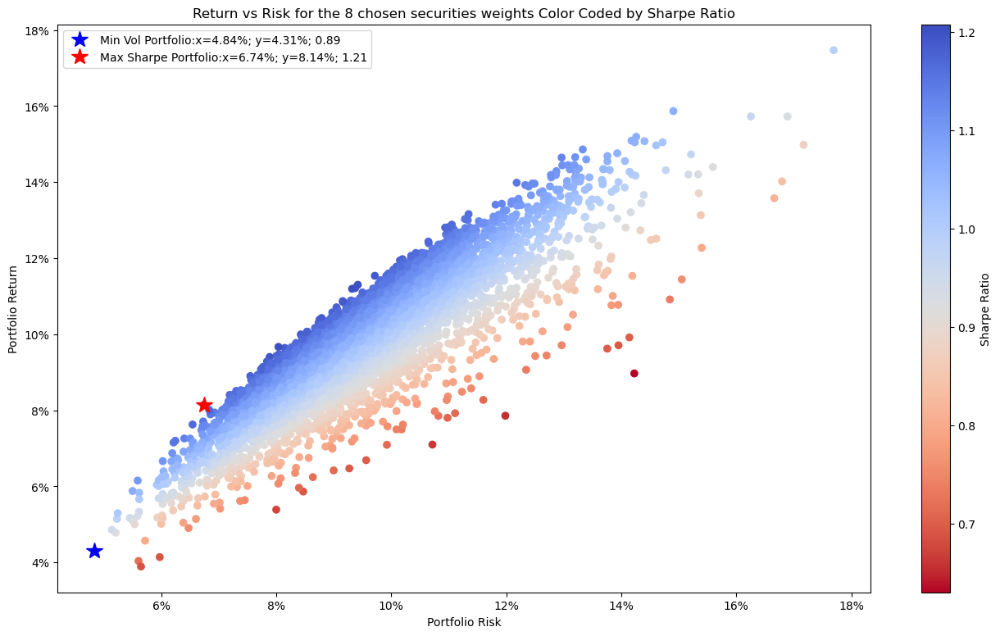

In [47]:
plt.figure(figsize=aspect_ratio)
ax = plt.subplot()
plt.scatter(pvols, prets, c = prets/pvols, marker='o', cmap='coolwarm_r')
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
plt.title('Return vs Risk for the 8 chosen securities weights Color Coded by Sharpe Ratio')
plt.xlabel('Portfolio Risk')
plt.ylabel('Portfolio Return')
plt.colorbar(label='Sharpe Ratio')
plt.plot(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], 'b*', markersize=15.0, label='Min Vol Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], prets[np.argmin(pvols)]/pvols[np.argmin(pvols)])) 
plt.plot(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], 'r*', markersize=15.0, label='Max Sharpe Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], np.max(prets/pvols)))
plt.legend()

We now look at the weight vectors associated the minimum volatility portfolio and the maximum Sharpe portfolio.

In [48]:
# Wt vector of portfolio with minimum volatility
all_wts[np.argmin(pvols)]*100 # Weights are denoted in the order - AAPL, AMZN, EUR, GOLD, SPY, GE, ATT and BOND 
# Weights are shown in percentages

array([ 4.31498299,  0.26242033, 30.78199438, 12.81325151,  6.11646112,
        3.70283027, 11.55771927, 30.45034012])

EURO and BOND have the lowest risk as so they have the maximum weight in the minimum volatility portfolio. Higher the risk, lower the weight assigned.

In [49]:
# Wt vector of portfolio with maximum Sharpe
wt_max_sharpe = all_wts[np.argmax(prets/pvols)] # Weights are denoted in the order - AAPL, AMZN, EUR, GOLD, SPY, GE, ATT and BOND 
wt_max_sharpe * 100
# Weights are shown in percentages

array([13.16876055,  4.6323368 ,  4.89945384, 20.99243733,  5.87933623,
        9.4630101 ,  6.97993029, 33.98473486])

For the portfolio with the maximum Sharpe, we speculate that the weights are assigned taking into consideration risk first and then returns i.e low risk followed by high returns. Hence BOND and GOLD have the highest weightage as they have low risk. EURO has a very low return and hence its weightage is low. 

---
# 9 to 10

We'll set the weights of the equal weighted portfolio.

In [50]:
eq_portfolio_wts = np.array([0.125] * 8)
eq_portfolio_wts

array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125])

Next, we'll calculate the return of the portfolio.

In [51]:
eq_portfolio_ret = annualization_factor * np.dot(eq_portfolio_wts, logReturnFinal8.mean().T)
eq_portfolio_ret

0.09828167357099317

We'll find the volatility.

In [52]:
eq_portfolio_vol = np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(eq_portfolio_wts, logReturnFinal8.cov()), eq_portfolio_wts.T))
eq_portfolio_vol

0.08691474948185968

Finally, we'll find the Sharpe ratio, which is return/volatility.

In [53]:
eq_portfolio_sharpe = eq_portfolio_ret / eq_portfolio_vol
eq_portfolio_sharpe

1.1307824524249008

In [54]:
# 'AAPL', 'AMZN', 'EUR', 'GOLD', 'SPY', 'GE', 'ATT', 'BOND'
logReturnFinal8 = logReturnFinal8.join(pd.DataFrame((wt_max_sharpe * logReturnFinal8).sum(axis = 1), columns = ['Portfolio']))

In [55]:
X = logReturnFinal8['SPY']

In [56]:
X = sm.add_constant(X)

In [57]:
logReturnFinal8

,AAPL,AMZN,EUR,GOLD,SPY,GE,ATT,BOND,Portfolio
2000-10-31,0.0,0.0,0.0,0.0,0.0,0.014934,0.007555,-0.001031,0.001590
2000-11-01,0.0,0.0,0.0,-0.0,-0.0,-0.006865,0.028573,0.001592,0.001886
2000-11-02,0.0,0.0,-0.0,-0.0,0.0,-0.013873,0.001115,0.000547,-0.001049
2000-11-03,-0.0,-0.0,0.0,0.0,0.0,-0.007009,-0.020984,-0.003520,-0.003324
2000-11-06,-0.0,-0.0,-0.0,-0.0,0.0,0.022030,0.010989,-0.001021,0.002505
...,...,...,...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,0.0,0.0,-0.0,0.032697,-0.034133,0.001688,0.001285
2018-12-26,0.0,0.0,-0.0,-0.0,0.0,-0.065712,0.025975,-0.002511,-0.005258
2018-12-27,-0.0,-0.0,0.0,0.0,0.0,0.016371,0.002490,0.002101,0.002437
2018-12-28,0.0,0.0,0.0,0.0,-0.0,-0.032479,0.010952,0.000285,-0.002212


In [58]:
y = logReturnFinal8['Portfolio']

In [59]:
Portfolio_Reg = sm.OLS(y, X)

In [60]:
Portfolio_Reg = Portfolio_Reg.fit()

In [61]:
print(Portfolio_Reg.summary())

                            OLS Regression Results                            
Dep. Variable:              Portfolio   R-squared:                       0.235
Model:                            OLS   Adj. R-squared:                  0.235
Method:                 Least Squares   F-statistic:                     1393.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):          3.50e-266
Time:                        23:06:06   Log-Likelihood:                 19011.
No. Observations:                4535   AIC:                        -3.802e+04
Df Residuals:                    4533   BIC:                        -3.800e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0002   5.44e-05      4.429      0.0

Calculating BETA Value

In [62]:
# the beta term
Portfolio_Reg.params.SPY

0.29301568672952627

In [63]:
# getting mean prediction value and R^2
port_Predicted = Portfolio_Reg.get_prediction().predicted_mean
port_r2 = Portfolio_Reg.rsquared 

Text(0.01, -0.02, 'Linear Fit:y=+0.000241 +0.293016x\nR-squared: 0.235127')

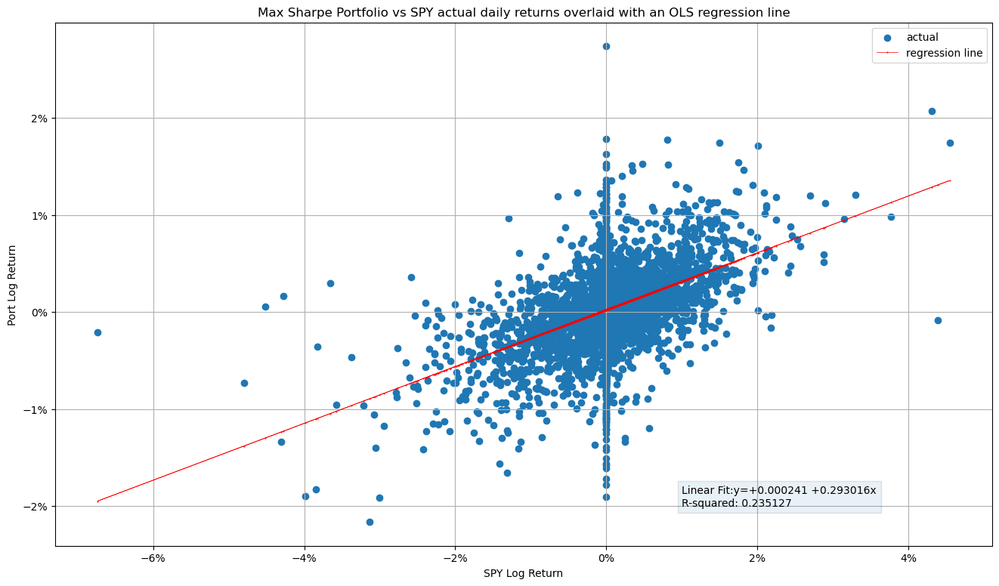

In [64]:
# now let's plot the scatter plot and overlay it with the regression line
plt.figure(figsize=aspect_ratio)
ax = plt.subplot()
plt.scatter(logReturnFinal8['SPY'], logReturnFinal8['Portfolio'], marker='o', label='actual')
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
plt.title('Max Sharpe Portfolio vs SPY actual daily returns overlaid with an OLS regression line')
plt.xlabel('SPY Log Return')
plt.ylabel('Port Log Return')
plt.plot(logReturnFinal8['SPY'], port_Predicted, marker='.', c='r', markersize=1.0, lw=0.5, label='regression line')
plt.legend()
plt.grid()
plt.text(0.01, -0.02, 'Linear Fit:y={:+.6f} {:+.6f}x\nR-squared: {:.6f}'.format(Portfolio_Reg.params.const, Portfolio_Reg.params.SPY, port_r2), bbox = dict(alpha=0.1))

---
# 11

### Mean Variance Optimization for Passive Strategies using instruments from the Super- Optimized Portfolio

Running the Monte Carlo for the 8 instruments itself

In [65]:
dfPrices_Final8 = dfPrices[['AAPL','AMZN','EUR','GOLD','SPY','GE','ATT','BOND']]
logReturns_no_strategy_mvo = np.log(dfPrices_Final8/ dfPrices_Final8.shift(1)).dropna()

In [66]:
logReturns_no_strategy_mvo

,AAPL,AMZN,EUR,GOLD,SPY,GE,ATT,BOND
2000-01-03,0.085034,0.160464,0.017829,0.003466,-0.009835,-0.031176,-0.036558,-0.005384
2000-01-04,-0.088077,-0.086884,0.005161,-0.023633,-0.039891,-0.040822,-0.060292,0.003638
2000-01-05,0.014527,-0.161039,0.002425,-0.008004,0.001787,-0.001738,0.015417,-0.004583
2000-01-06,-0.090514,-0.061914,0.000678,0.003921,-0.016202,0.013281,-0.026781,0.002486
2000-01-07,0.046281,0.059222,-0.003200,0.002310,0.056452,0.037991,0.008535,0.002563
...,...,...,...,...,...,...,...,...
2018-12-24,-0.026215,-0.024613,0.002985,0.009722,-0.026778,-0.032697,-0.034133,0.001688
2018-12-26,0.068053,0.090254,-0.004658,-0.001640,0.049290,0.065712,0.025975,-0.002511
2018-12-27,-0.006511,-0.006315,0.006759,0.006740,0.007648,-0.016371,0.002490,0.002101
2018-12-28,0.000512,0.011144,0.001224,0.003912,-0.001291,0.032479,0.010952,0.000285


In [67]:
prets = []
pvols = []
all_wts = []
rng = np.random.default_rng(seed=42)
for iter in range(0, 5000): # Number of weight combinations = 5000
    wts = rng.random(logReturns_no_strategy_mvo.shape[1]) # Number of weights = number of securities
    wts /= np.sum(wts)
    prets.append(annualization_factor * np.dot(wts, logReturns_no_strategy_mvo.mean().T)) # Annual return of the portfolio is appended to prets
    pvols.append(np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(wts, logReturns_no_strategy_mvo.cov()), wts.T))) # Annual risk of the portfolio is appended to pvols
    all_wts.append(wts) # Weight combination is appended to all_wts
prets = np.array(prets)
pvols = np.array(pvols)
all_wts = np.array(all_wts)

We'll plot the risk/ return scatter plot of all the 5000 portfolios without any strategy

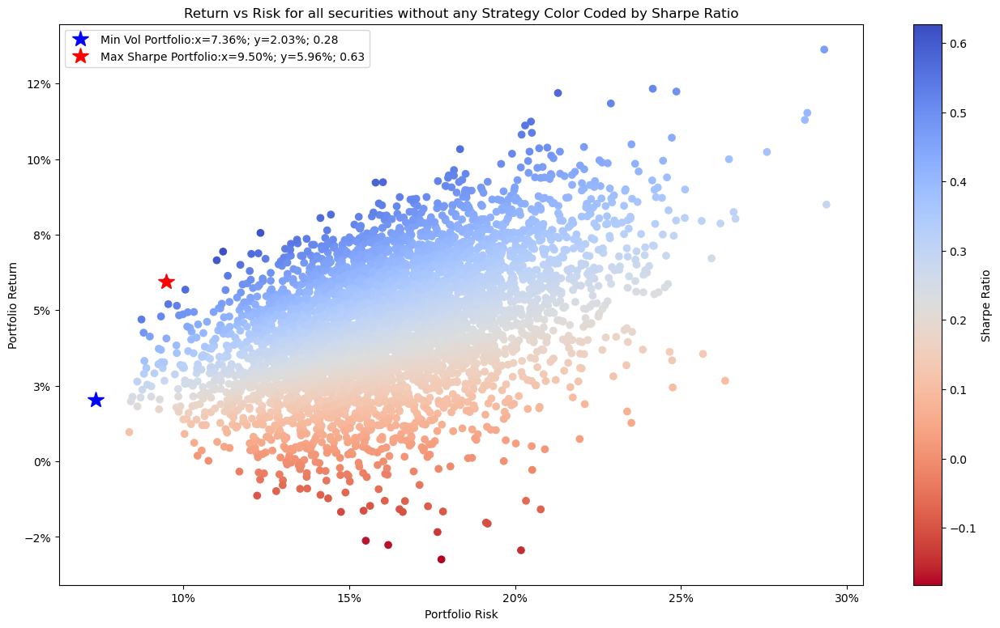

In [68]:
plt.figure(figsize=aspect_ratio)
ax = plt.subplot()
plt.scatter(pvols, prets, c = prets/pvols, marker='o', cmap='coolwarm_r')
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
plt.title('Return vs Risk for all securities without any Strategy Color Coded by Sharpe Ratio')
plt.xlabel('Portfolio Risk')
plt.ylabel('Portfolio Return')
plt.colorbar(label='Sharpe Ratio')
plt.plot(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], 'b*', markersize=15.0, label='Min Vol Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], prets[np.argmin(pvols)]/pvols[np.argmin(pvols)])) 
plt.plot(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], 'r*', markersize=15.0, label='Max Sharpe Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], np.max(prets/pvols)))
plt.legend()

Finally, we'll look at the weight vectors associated the minimum volatility portfolio and the maximum Sharpe portfolio.

In [69]:
# Wt vector of portfolio with minimum volatility
all_wts[np.argmin(pvols)]*100 # AAPL,AMZN,EUR,GOLD,SPY,GE,ATT,BOND

array([ 4.31498299,  0.26242033, 30.78199438, 12.81325151,  6.11646112,
        3.70283027, 11.55771927, 30.45034012])

In [70]:
# Wt vector of portfolio with maximum Sharpe
all_wts[np.argmax(prets/pvols)]*100 # Weights are denoted in the order - AAPL, AMZN, EUR, GOLD, SPY, GE, ATT and BOND 

array([11.53477413,  7.71770849,  7.63129634, 20.58456118,  7.62654914,
        0.88398543,  2.3351006 , 41.68602469])

In [71]:
# Maximum Sharpe 
np.max(prets/pvols)

0.6270568500617605

Runnin Monte Carlo For Go Flat For all the 7 instruments and Short for the 1 instrument

In [72]:
dfPrices_Final7 = dfPrices[['AAPL','AMZN','EUR','GOLD','SPY','ATT','BOND']] # GE goes short 

In [73]:
logReturnGoFlat_Final7 = dfPrices_Final7.copy()
for j in range(len(dfPrices_Final7.columns)):
    logReturnGoFlat_Final7.iloc[:,j] = movingAverageCrossover(dfPrices_Final7.iloc[:,j].to_frame(), fastWindow = 39, slowWindow = 210, flatOrShort = 0)['SMAReturns']

In [74]:
logReturnAll_Flat_Short = pd.concat([logReturnGoFlat_Final7, logReturnGoShort], axis = 1)
logReturnAll_Flat_Short

,AAPL,AMZN,EUR,GOLD,SPY,ATT,BOND,GE
1999-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,0.032697
2018-12-26,0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.065712
2018-12-27,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.016371
2018-12-28,0.0,0.0,0.0,0.0,-0.0,0.0,0.0,-0.032479


In [75]:
logReturnAll_Flat_Short.dropna(inplace = True)

In [76]:
prets = []
pvols = []
all_wts = []
rng = np.random.default_rng(seed=42)
for iter in range(0, 5000): # Number of weight combinations = 5000
    wts = rng.random(logReturnAll_Flat_Short.shape[1]) # Number of weights = number of securities
    wts /= np.sum(wts)
    prets.append(annualization_factor * np.dot(wts, logReturnAll_Flat_Short.mean().T)) # Annual return of the portfolio is appended to prets
    pvols.append(np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(wts, logReturnAll_Flat_Short.cov()), wts.T))) # Annual risk of the portfolio is appended to pvols
    all_wts.append(wts) # Weight combination is appended to all_wts
prets = np.array(prets)
pvols = np.array(pvols)
all_wts = np.array(all_wts)

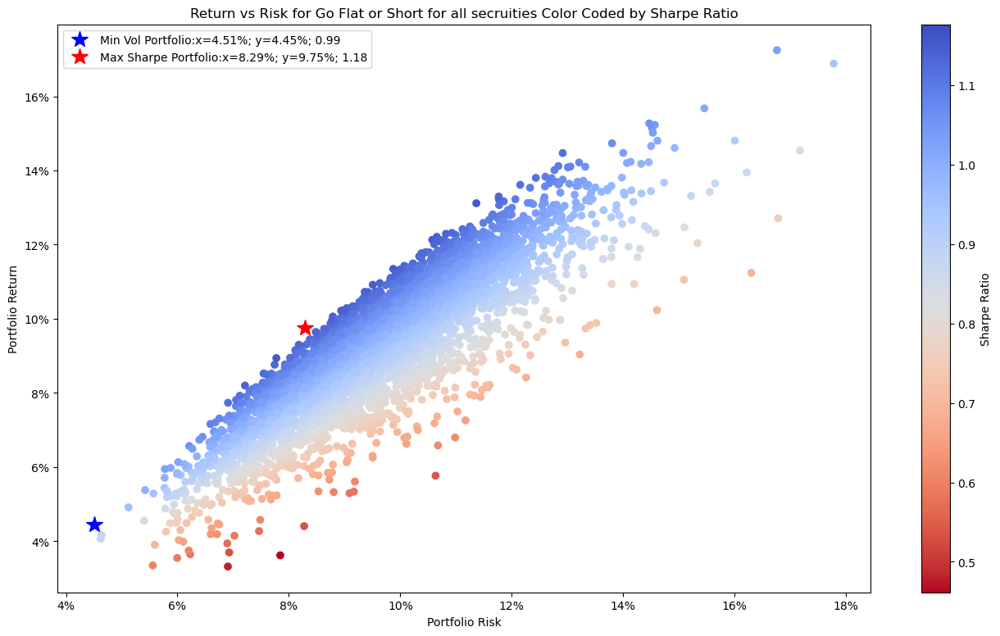

In [77]:
plt.figure(figsize=aspect_ratio)
ax = plt.subplot()
plt.scatter(pvols, prets, c = prets/pvols, marker='o', cmap='coolwarm_r')
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
plt.title('Return vs Risk for Go Flat or Short for all secruities Color Coded by Sharpe Ratio')
plt.xlabel('Portfolio Risk')
plt.ylabel('Portfolio Return')
plt.colorbar(label='Sharpe Ratio')
plt.plot(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], 'b*', markersize=15.0, label='Min Vol Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], prets[np.argmin(pvols)]/pvols[np.argmin(pvols)])) 
plt.plot(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], 'r*', markersize=15.0, label='Max Sharpe Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], np.max(prets/pvols)))
plt.legend()

Finally, we'll look at the weight vectors associated the minimum volatility portfolio and the maximum Sharpe portfolio.

In [78]:
# Wt vector of portfolio with minimum volatility
all_wts[np.argmin(pvols)]*100 # Weights are denoted in the order - AAPL, AMZN, EUR, GOLD, SPY,ATT, BOND and GE 

array([ 6.07395881,  1.75600268, 18.24960584, 11.28617268,  6.87005691,
        8.13395483, 42.72317293,  4.90707531])

In [79]:
# Wt vector of portfolio with maximum Sharpe
all_wts[np.argmax(prets/pvols)]*100 # Weights are denoted in the order - AAPL, AMZN, EUR, GOLD, SPY,ATT, BOND and GE 

array([17.85774174,  7.99462778,  6.90150571, 26.9002851 ,  4.80815352,
        0.89503579, 26.19840293,  8.44424743])

In [80]:
# Maximum Sharpe 
np.max(prets/pvols)

1.1768528872335466

Running Monte Carlo for BB strategy for all the 8 instruments

In [81]:
logReturnBB_Final8 = dfPrices_Final8.copy()
for j in range(len(dfPrices_Final8.columns)):
    logReturnBB_Final8.iloc[:,j] = bollingerBands(dfPrices_Final8.iloc[:,j].to_frame(), dfPrices_Final8.columns[j], lookbackWindow = 20, stdevBand = 2)[['BBReturns']]

In [82]:
logReturnBB_Final8

,AAPL,AMZN,EUR,GOLD,SPY,GE,ATT,BOND
1999-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2018-12-24,-0.026215,-0.024613,-0.002985,-0.009722,-0.026778,-0.0,-0.034133,-0.001688
2018-12-26,0.068053,0.090254,0.004658,0.001640,0.049290,0.0,0.025975,0.002511
2018-12-27,-0.006511,-0.006315,0.000000,-0.006740,0.007648,-0.0,0.002490,-0.002101
2018-12-28,0.000512,0.011144,0.000000,-0.003912,-0.001291,0.0,0.010952,-0.000285


In [83]:
logReturnBB_Final8.dropna(inplace = True)

In [84]:
prets = []
pvols = []
all_wts = []
rng = np.random.default_rng(seed=42)
for iter in range(0, 5000): # Number of weight combinations = 5000
    wts = rng.random(logReturnBB_Final8.shape[1]) # Number of weights = number of securities
    wts /= np.sum(wts)
    prets.append(annualization_factor * np.dot(wts, logReturnBB_Final8.mean().T)) # Annual return of the portfolio is appended to prets
    pvols.append(np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(wts, logReturnBB_Final8.cov()), wts.T))) # Annual risk of the portfolio is appended to pvols
    all_wts.append(wts) # Weight combination is appended to all_wts
prets = np.array(prets)
pvols = np.array(pvols)
all_wts = np.array(all_wts)

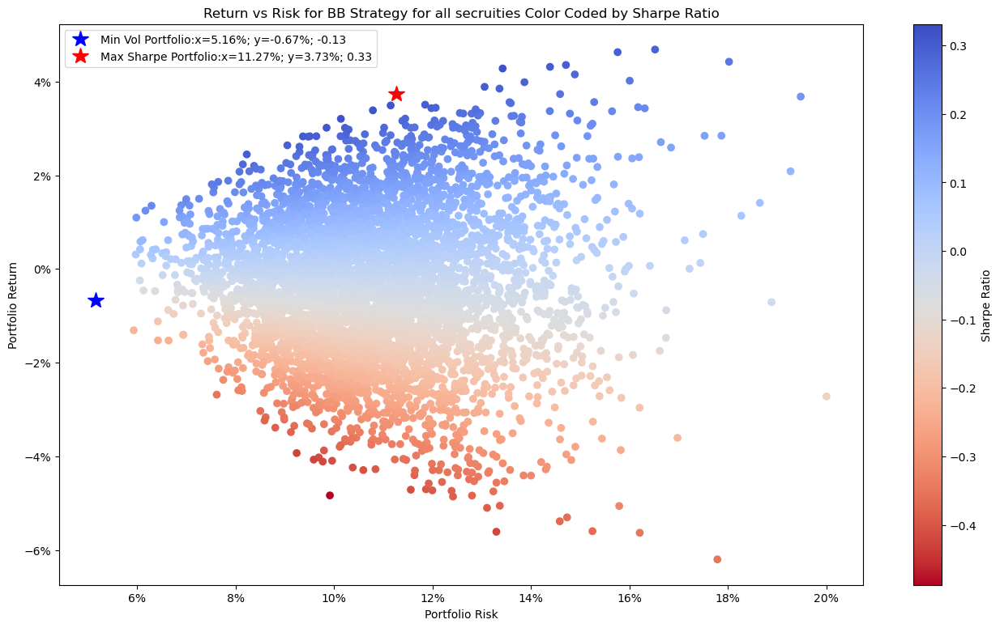

In [85]:
plt.figure(figsize=aspect_ratio)
ax = plt.subplot()
plt.scatter(pvols, prets, c = prets/pvols, marker='o', cmap='coolwarm_r')
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
plt.title('Return vs Risk for BB Strategy for all secruities Color Coded by Sharpe Ratio')
plt.xlabel('Portfolio Risk')
plt.ylabel('Portfolio Return')
plt.colorbar(label='Sharpe Ratio')
plt.plot(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], 'b*', markersize=15.0, label='Min Vol Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], prets[np.argmin(pvols)]/pvols[np.argmin(pvols)])) 
plt.plot(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], 'r*', markersize=15.0, label='Max Sharpe Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], np.max(prets/pvols)))
plt.legend()

Finally, we'll look at the weight vectors associated the minimum volatility portfolio and the maximum Sharpe portfolio.

In [86]:
# Wt vector of portfolio with minimum volatility
all_wts[np.argmin(pvols)]*100  # Weights are denoted in the order - AAPL, AMZN, EUR, GOLD, SPY, GE, ATT and BOND

array([ 4.31498299,  0.26242033, 30.78199438, 12.81325151,  6.11646112,
        3.70283027, 11.55771927, 30.45034012])

In [87]:
# Wt vector of portfolio with maximum Sharpe
all_wts[np.argmax(prets/pvols)]*100 # Weights are denoted in the order - AAPL, AMZN, EUR, GOLD, SPY, GE, ATT and BOND 

array([ 1.33867226, 18.88294594,  8.82630492, 19.46699149, 23.21495018,
        0.64949927, 23.56912947,  4.05150648])

In [88]:
# Maximum Sharpe 
np.max(prets/pvols)

0.3312056453923718

Running the above passive strategies for all the instruments in super- optimized portfolio we found the Sharpe to be 0.63, 1.18 & 0.33 respectively which is less than our super- optimized portfolio which is 1.21, thus we can say that with confidence that our portfolio outperforms these passive strategies for the chosen 8 instruments.

---
# 12

In [89]:
logReturnFinal8

,AAPL,AMZN,EUR,GOLD,SPY,GE,ATT,BOND,Portfolio
2000-10-31,0.0,0.0,0.0,0.0,0.0,0.014934,0.007555,-0.001031,0.001590
2000-11-01,0.0,0.0,0.0,-0.0,-0.0,-0.006865,0.028573,0.001592,0.001886
2000-11-02,0.0,0.0,-0.0,-0.0,0.0,-0.013873,0.001115,0.000547,-0.001049
2000-11-03,-0.0,-0.0,0.0,0.0,0.0,-0.007009,-0.020984,-0.003520,-0.003324
2000-11-06,-0.0,-0.0,-0.0,-0.0,0.0,0.022030,0.010989,-0.001021,0.002505
...,...,...,...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,0.0,0.0,-0.0,0.032697,-0.034133,0.001688,0.001285
2018-12-26,0.0,0.0,-0.0,-0.0,0.0,-0.065712,0.025975,-0.002511,-0.005258
2018-12-27,-0.0,-0.0,0.0,0.0,0.0,0.016371,0.002490,0.002101,0.002437
2018-12-28,0.0,0.0,0.0,0.0,-0.0,-0.032479,0.010952,0.000285,-0.002212


In [90]:
calcSummaryStatistics(logReturnFinal8)

,AAPL,AMZN,EUR,GOLD,SPY,GE,ATT,BOND,Portfolio
Average Annual Return,23.29%,19.67%,1.52%,8.19%,6.42%,14.13%,4.38%,1.03%,8.14%
Annual Risk,28.08%,33.20%,7.19%,14.35%,11.16%,31.07%,19.27%,3.75%,6.74%
Sharpe Ratio,0.829357,0.592394,0.210973,0.571125,0.575631,0.454702,0.227073,0.274776,1.207357
maxDD,-89.44%,-95.33%,-22.49%,-40.06%,-19.50%,-96.54%,-39.89%,-14.21%,-11.73%
Success Ratio,65.34%,67.25%,70.69%,68.49%,69.77%,51.69%,74.40%,52.46%,55.04%


From the summary statistics it is quite evident the sharpe ratio is the highest among all the individual components, the average annual return is better than SPY, the annual risk is much lower than all tickers except bond and the max draw down is the lowest as compared to other instruments.

#### We pledge on our honor that we have not given nor received any unauthorized assistance on this assignment to/from other groups
##### - Aditya Bhide, Amal Byju, Kathan Shah, Sreyas Sourav, Vaibhav Balasubramanian